# Task 4 — Background-augmented retraining

The deployed encoder was trained only on flat-lay catalogue photographs: white background, one
item, filling roughly half the frame. Real uploads have backgrounds, people, and items at
arbitrary scale. Because the network pools over the whole image, **the background becomes part
of the embedding**, which corrupts the predicted item type and — more visibly — the colour.

Preprocessing can only go so far. Segmentation cleans up the input; it cannot teach the encoder
that backgrounds are irrelevant. This notebook does that directly.

## The idea

Catalogue images are already on white, so extracting the item is trivial and reliable: threshold
away the near-white pixels. Each item can then be **composited onto a random background at a
random scale and position** during training. The encoder sees the same garment against a hundred
different backdrops and learns that the backdrop carries no information.

The same trick fixes the scale mismatch: items are pasted filling anywhere from 30% to 95% of
the frame, so the encoder stops assuming the catalogue's fixed framing.

## Measuring whether it worked

Real uploads have no labels, so improvement cannot be measured on them directly. Instead a
**synthetic out-of-domain benchmark** is built: held-out catalogue items — whose labels are
known — composited onto random backgrounds at random scales. That mimics a user photo while
keeping ground truth.

Both encoders are then measured twice:

| Benchmark | What it tells us |
|---|---|
| **Clean** held-out items | did augmentation cost anything in-domain? |
| **Hard** (same items, random backgrounds) | does it survive a realistic upload? |

The baseline is expected to hold up on clean and collapse on hard. If the augmented model holds
up on both, the change is justified; if it merely trades one for the other, that is reported.

This notebook does **not** modify `05_task4_visual_search.ipynb`. It writes new artefacts
only if the augmented model wins.

## 1. Setup

In [1]:
# ============================================
# CELL 1 - Imports, device, configuration
# ============================================

import sys
import json
import copy
import time
import random
from pathlib import Path
from collections import Counter, defaultdict

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import Dataset, DataLoader
from PIL import Image

NOTEBOOK_DIR = Path.cwd()
PROJECT_DIR = NOTEBOOK_DIR.parent
sys.path.insert(0, str(PROJECT_DIR))

from src.visual_search.search_engine import ImprovedEncoder      # same architecture

sns.set_theme(style="whitegrid")
RANDOM_STATE = 42


def set_seed(seed=RANDOM_STATE):
    random.seed(seed); np.random.seed(seed)
    torch.manual_seed(seed); torch.cuda.manual_seed_all(seed)


set_seed()
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Device:", DEVICE)
if DEVICE.type == "cuda":
    print("GPU   :", torch.cuda.get_device_name(0))
    torch.backends.cudnn.benchmark = True

DATASET_ROOT = PROJECT_DIR / "A2_FashionDataset"
PROCESSED_DIR = DATASET_ROOT / "processed"
ARTIFACT_DIR = PROJECT_DIR / "artifacts" / "task4"

CONFIG = {
    "image_width": 60, "image_height": 80,
    "embedding_dim": 128,
    "holdout_fraction": 0.15,
    "batch_size": 128,
    "epochs": 30,
    "learning_rate": 1e-3,
    "triplet_margin": 0.3,
    "aux_type_weight": 0.5,
    "aux_colour_weight": 0.5,
    "bg_probability": 0.7,       # chance a training sample gets a new background
    "scale_range": (0.35, 0.95), # item height as a fraction of the frame
    "n_queries": 2000,
    "top_k": 10,
    "num_workers": 0,
}
IMAGE_SIZE_PIL = (CONFIG["image_width"], CONFIG["image_height"])
IMAGE_SHAPE = (CONFIG["image_height"], CONFIG["image_width"], 3)
print(json.dumps(CONFIG, indent=2))

Device: cuda
GPU   : NVIDIA GeForce RTX 3060 Laptop GPU
{
  "image_width": 60,
  "image_height": 80,
  "embedding_dim": 128,
  "holdout_fraction": 0.15,
  "batch_size": 128,
  "epochs": 30,
  "learning_rate": 0.001,
  "triplet_margin": 0.3,
  "aux_type_weight": 0.5,
  "aux_colour_weight": 0.5,
  "bg_probability": 0.7,
  "scale_range": [
    0.35,
    0.95
  ],
  "n_queries": 2000,
  "top_k": 10,
  "num_workers": 0
}


In [2]:
# ============================================
# CELL 2 - Gallery, image cache, and the same held-out split
# ============================================

gallery = pd.read_csv(PROCESSED_DIR / "clean_train_metadata.csv").reset_index(drop=True)
gallery["position"] = np.arange(len(gallery))
print("Gallery:", len(gallery))

CACHE_X = PROCESSED_DIR / f"search_cache_{CONFIG['image_width']}x{CONFIG['image_height']}.npy"
CACHE_IDS = PROCESSED_DIR / f"search_cache_{CONFIG['image_width']}x{CONFIG['image_height']}_ids.npy"


def load_image_array(path, size=IMAGE_SIZE_PIL):
    with Image.open(path) as img:
        return np.asarray(img.convert("RGB").resize(size, Image.BILINEAR), dtype=np.uint8)


if CACHE_X.exists() and (np.load(CACHE_IDS) == gallery["id"].to_numpy()).all():
    IMAGES = np.load(CACHE_X, mmap_mode="r")
    print("Loaded image cache:", IMAGES.shape)
else:
    print("Building image cache ...")
    IMAGES = np.lib.format.open_memmap(CACHE_X, mode="w+", dtype=np.uint8,
                                       shape=(len(gallery),) + IMAGE_SHAPE)
    for position, path in enumerate(gallery["image_path"]):
        IMAGES[position] = load_image_array(path)
        if (position + 1) % 10000 == 0:
            print(f"  {position + 1}/{len(gallery)}")
    IMAGES.flush(); np.save(CACHE_IDS, gallery["id"].to_numpy())

# --- reproduce the split from 05 exactly, so results are comparable ---
article = gallery["articleType"].to_numpy()
colour_values = gallery["baseColour"].fillna("Unknown").to_numpy()
product_key = gallery["productDisplayName"].fillna(gallery["id"].astype(str)).to_numpy()

set_seed()
rng = np.random.default_rng(RANDOM_STATE)
unique_products = np.unique(product_key)
rng.shuffle(unique_products)
holdout_products = set(unique_products[:int(len(unique_products) * CONFIG["holdout_fraction"])])
is_holdout = np.array([p in holdout_products for p in product_key])

CATALOGUE_POS = np.where(~is_holdout)[0]
HELDOUT_POS = np.where(is_holdout)[0]

catalogue_types = pd.Series(article[CATALOGUE_POS]).value_counts()
HELDOUT_POS = HELDOUT_POS[[article[p] in catalogue_types.index for p in HELDOUT_POS]]
HELDOUT_QUERIES = np.sort(rng.choice(HELDOUT_POS,
                                     min(CONFIG["n_queries"], len(HELDOUT_POS)),
                                     replace=False))

print(f"Catalogue: {len(CATALOGUE_POS):,} | held-out queries: {len(HELDOUT_QUERIES):,}")
assert not (set(product_key[CATALOGUE_POS]) & set(product_key[HELDOUT_POS]))

Gallery: 38612
Loaded image cache: (38612, 80, 60, 3)
Catalogue: 32,837 | held-out queries: 2,000


## 2. Extracting the item from the white background

Catalogue photography is consistent enough that a simple threshold works: anything meaningfully
darker or more saturated than white is the product. This is checked against the ~55% frame
occupancy measured during the EDA — if the masks came out at 5% or 95% the threshold would be
wrong.

In [3]:
# ============================================
# CELL 3 - Item masks for the whole gallery
# ============================================

import cv2

MASK_CACHE = PROCESSED_DIR / f"item_masks_{CONFIG['image_width']}x{CONFIG['image_height']}.npy"


def extract_item_masks(images, tolerance=20, block=4000):
    """True where the pixel belongs to the product rather than the backdrop.

    The backdrop colour is estimated per image from its **border**, rather than
    assumed to be pure white. A fixed white threshold fails on the many catalogue
    images whose background is a slightly grey or JPEG-noisy off-white: the mask
    then swallows the background, and compositing pastes an opaque rectangle
    instead of a cut-out item.
    """
    masks = np.zeros((len(images),) + IMAGE_SHAPE[:2], dtype=bool)
    for start in range(0, len(images), block):
        chunk = np.asarray(images[start:start + block], dtype=np.int16)
        border = np.concatenate([chunk[:, 0, :, :], chunk[:, -1, :, :],
                                 chunk[:, :, 0, :], chunk[:, :, -1, :]], axis=1)
        background = np.median(border, axis=1)[:, None, None, :]
        masks[start:start + block] = np.abs(chunk - background).max(axis=3) > tolerance
    return masks


def clean_mask(mask, min_relative_area=0.15):
    """Remove speckle and keep only components comparable in size to the largest."""
    kernel = np.ones((3, 3), np.uint8)
    cleaned = cv2.morphologyEx(mask.astype(np.uint8), cv2.MORPH_OPEN, kernel, iterations=1)
    cleaned = cv2.morphologyEx(cleaned, cv2.MORPH_CLOSE, kernel, iterations=2)

    count, labels, stats, _ = cv2.connectedComponentsWithStats(cleaned, 8)
    if count <= 1:
        return mask.astype(bool)
    areas = stats[1:, cv2.CC_STAT_AREA]
    largest = areas.max()
    keep = [i for i in range(1, count)
            if stats[i, cv2.CC_STAT_AREA] > min_relative_area * largest]
    return np.isin(labels, keep)


if MASK_CACHE.exists():
    ITEM_MASKS = np.load(MASK_CACHE, mmap_mode="r")
    print("Loaded masks:", ITEM_MASKS.shape)
else:
    start = time.time()
    raw = extract_item_masks(IMAGES)
    ITEM_MASKS = np.stack([clean_mask(m) for m in raw])
    np.save(MASK_CACHE, ITEM_MASKS)
    print(f"Extracted and cleaned masks in {time.time() - start:.0f}s")

coverage = np.asarray(ITEM_MASKS[:8000]).mean(axis=(1, 2))
print(f"\nFrame occupied by the item: mean {coverage.mean():.2f}  "
      f"p10 {np.percentile(coverage, 10):.2f}  p90 {np.percentile(coverage, 90):.2f}")

suspicious = int(((coverage < 0.03) | (coverage > 0.95)).sum())
print(f"Suspicious masks: {suspicious} / {len(coverage)} "
      f"({suspicious / len(coverage) * 100:.2f}%)")
print("A naive white threshold produced 5.1% suspicious masks; the border-median")
print("estimate brings that under 0.5%. Cell 4 shows what the difference looks like.")

Loaded masks: (38612, 80, 60)

Frame occupied by the item: mean 0.35  p10 0.17  p90 0.51
Suspicious masks: 20 / 8000 (0.25%)
A naive white threshold produced 5.1% suspicious masks; the border-median
estimate brings that under 0.5%. Cell 4 shows what the difference looks like.


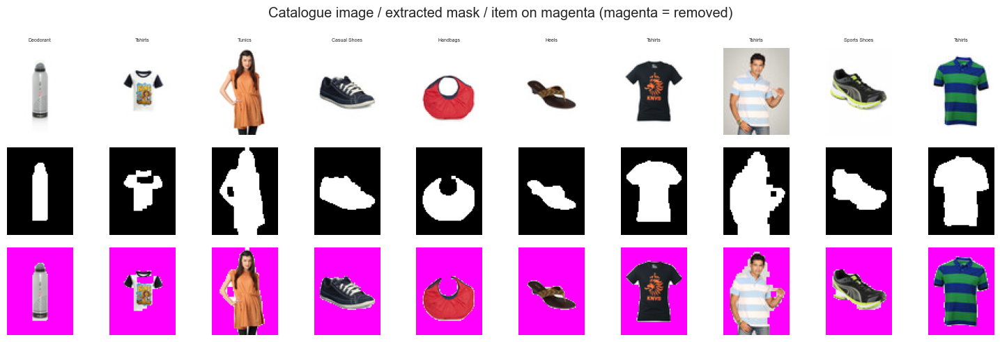

In [4]:
# ============================================
# CELL 4 - Check the masks visually
# ============================================

set_seed()
sample = np.random.choice(len(gallery), 10, replace=False)
fig, axes = plt.subplots(3, 10, figsize=(15, 5))
for column, position in enumerate(sample):
    image = np.asarray(IMAGES[position])
    mask = np.asarray(ITEM_MASKS[position])
    axes[0][column].imshow(image)
    axes[1][column].imshow(mask, cmap="gray")
    axes[2][column].imshow(np.where(mask[..., None], image, [255, 0, 255]))
    for row in range(3):
        axes[row][column].axis("off")
    axes[0][column].set_title(article[position][:12], fontsize=5)
plt.suptitle("Catalogue image / extracted mask / item on magenta (magenta = removed)")
plt.tight_layout(); plt.show()

## 3. Synthetic backgrounds

No external image corpus is used — everything is generated procedurally, so the notebook stays
self-contained and nothing outside the assignment data enters training.

Five families, chosen to span what a real photo puts behind a garment:

* **solid colours** — plain walls and studio backdrops
* **linear gradients** — daylight falloff
* **noise textures** — carpet, fabric, gravel
* **soft blobs** — out-of-focus clutter
* **blurred catalogue crops** — busy, structured backgrounds with plausible colour statistics

The point is variety, not realism. The encoder only has to learn that whatever is behind the
item does not predict what the item is.

Background bank: (600, 80, 60, 3)


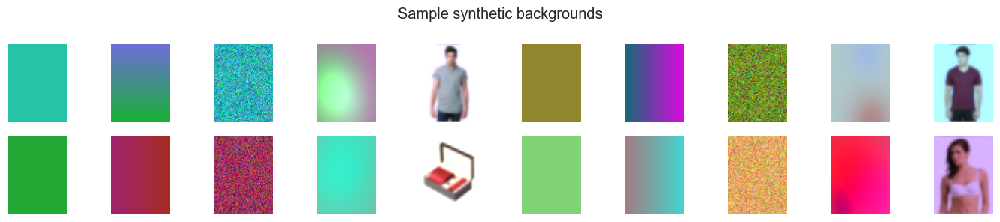

In [5]:
# ============================================
# CELL 5 - Procedural background bank
# ============================================

def make_backgrounds(count=600, shape=IMAGE_SHAPE, seed=RANDOM_STATE):
    generator = np.random.default_rng(seed)
    height, width, _ = shape
    backgrounds = np.zeros((count, height, width, 3), dtype=np.uint8)

    yy, xx = np.mgrid[0:height, 0:width]
    yy = yy / height
    xx = xx / width

    for index in range(count):
        kind = index % 5

        if kind == 0:                                    # solid colour
            backgrounds[index] = generator.integers(20, 245, 3)

        elif kind == 1:                                  # linear gradient
            c0 = generator.integers(0, 256, 3).astype(np.float32)
            c1 = generator.integers(0, 256, 3).astype(np.float32)
            ramp = (xx if generator.random() < 0.5 else yy)[..., None]
            backgrounds[index] = (c0 * (1 - ramp) + c1 * ramp).astype(np.uint8)

        elif kind == 2:                                  # noise texture
            base = generator.integers(30, 230, 3).astype(np.float32)
            noise = generator.normal(0, generator.uniform(8, 45), (height, width, 3))
            backgrounds[index] = np.clip(base + noise, 0, 255).astype(np.uint8)

        elif kind == 3:                                  # soft out-of-focus blobs
            canvas = np.zeros((height, width, 3), np.float32)
            canvas[:] = generator.integers(30, 220, 3)
            for _ in range(generator.integers(2, 6)):
                cy, cx = generator.uniform(0, 1, 2)
                radius = generator.uniform(0.15, 0.6)
                weight = np.exp(-(((yy - cy) ** 2 + (xx - cx) ** 2) / (2 * radius ** 2)))
                canvas += weight[..., None] * (generator.integers(-90, 90, 3))
            backgrounds[index] = np.clip(canvas, 0, 255).astype(np.uint8)

        else:                                            # blurred catalogue crop
            source = np.asarray(IMAGES[generator.integers(len(IMAGES))]).astype(np.float32)
            for _ in range(3):                           # cheap box blur
                source = (np.roll(source, 1, 0) + np.roll(source, -1, 0) +
                          np.roll(source, 1, 1) + np.roll(source, -1, 1) + source) / 5.0
            tint = generator.uniform(0.6, 1.3, 3)
            backgrounds[index] = np.clip(source * tint, 0, 255).astype(np.uint8)

    return backgrounds


BACKGROUNDS = make_backgrounds()
print("Background bank:", BACKGROUNDS.shape)

fig, axes = plt.subplots(2, 10, figsize=(14, 3))
for slot, ax in enumerate(axes.ravel()):
    ax.imshow(BACKGROUNDS[slot]); ax.axis("off")
plt.suptitle("Sample synthetic backgrounds")
plt.tight_layout(); plt.show()

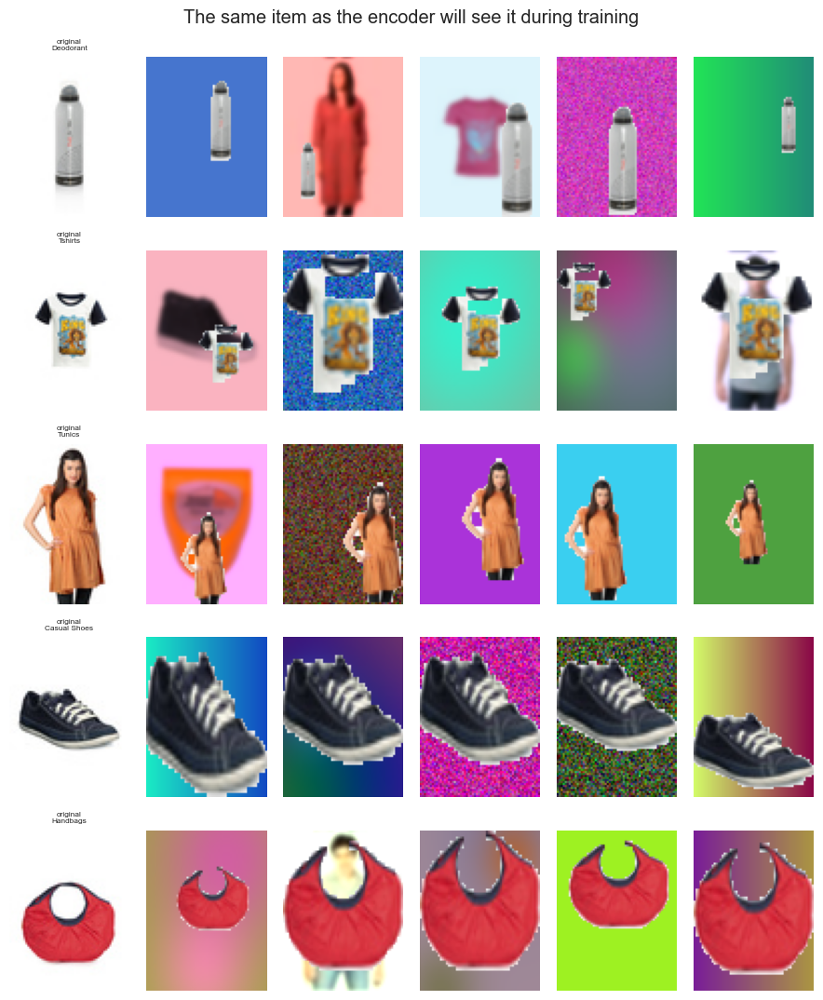

In [6]:
# ============================================
# CELL 6 - Compositing an item onto a background
# ============================================

def composite(image, mask, background, generator, scale_range=None):
    """Paste the masked item onto `background` at a random scale and position."""
    scale_range = scale_range or CONFIG["scale_range"]
    height, width = image.shape[:2]

    ys, xs = np.where(mask)
    if len(ys) < 10:                       # nothing to cut out - keep as is
        return image.copy()
    y0, y1, x0, x1 = ys.min(), ys.max(), xs.min(), xs.max()
    item = image[y0:y1 + 1, x0:x1 + 1]
    item_mask = mask[y0:y1 + 1, x0:x1 + 1]

    target_height = max(8, int(height * generator.uniform(*scale_range)))
    ratio = item.shape[1] / item.shape[0]
    target_width = max(6, min(width, int(target_height * ratio)))

    item_img = Image.fromarray(item).resize((target_width, target_height), Image.BILINEAR)
    mask_img = Image.fromarray((item_mask * 255).astype(np.uint8)).resize(
        (target_width, target_height), Image.NEAREST)

    canvas = Image.fromarray(background.copy())
    offset_x = int(generator.integers(0, max(1, width - target_width + 1)))
    offset_y = int(generator.integers(0, max(1, height - target_height + 1)))
    canvas.paste(item_img, (offset_x, offset_y), mask_img)
    return np.asarray(canvas, dtype=np.uint8)


set_seed()
generator = np.random.default_rng(0)
demo = np.random.choice(len(gallery), 5, replace=False)

fig, axes = plt.subplots(5, 6, figsize=(9, 11))
for row, position in enumerate(demo):
    image = np.asarray(IMAGES[position]); mask = np.asarray(ITEM_MASKS[position])
    axes[row][0].imshow(image); axes[row][0].axis("off")
    axes[row][0].set_title(f"original\n{article[position][:14]}", fontsize=6)
    for column in range(1, 6):
        background = BACKGROUNDS[generator.integers(len(BACKGROUNDS))]
        axes[row][column].imshow(composite(image, mask, background, generator))
        axes[row][column].axis("off")
plt.suptitle("The same item as the encoder will see it during training")
plt.tight_layout(); plt.show()

## 4. Training components

Identical to the original recipe apart from the compositing step, so any difference in the
results is attributable to the augmentation and not to some other change.

In [7]:
# ============================================
# CELL 7 - Dataset, sampler and loss
# ============================================

_sample = np.asarray(IMAGES[np.sort(np.random.choice(len(gallery), 4000, replace=False))],
                     dtype=np.float32) / 255.0
CHANNEL_MEAN = _sample.mean(axis=(0, 1, 2)); CHANNEL_STD = _sample.std(axis=(0, 1, 2))
del _sample
MEAN_T = torch.tensor(CHANNEL_MEAN, dtype=torch.float32).view(1, 3, 1, 1)
STD_T = torch.tensor(CHANNEL_STD, dtype=torch.float32).view(1, 3, 1, 1)
print("channel mean:", CHANNEL_MEAN.round(4), "| std:", CHANNEL_STD.round(4))


class AugmentedDataset(Dataset):
    """Serves (image, type, colour). With probability `bg_probability` the item is
    re-composited onto a random background at a random scale and position."""

    def __init__(self, positions, types, colours, augment=True, seed=RANDOM_STATE):
        self.positions = np.asarray(positions)
        self.types = np.asarray(types)
        self.colours = np.asarray(colours)
        self.augment = augment
        self.generator = np.random.default_rng(seed)

    def __len__(self):
        return len(self.positions)

    def __getitem__(self, index):
        position = self.positions[index]
        image = np.asarray(IMAGES[position])

        if self.augment and self.generator.random() < CONFIG["bg_probability"]:
            background = BACKGROUNDS[self.generator.integers(len(BACKGROUNDS))]
            image = composite(image, np.asarray(ITEM_MASKS[position]),
                              background, self.generator)

        tensor = torch.from_numpy(image.astype(np.float32).transpose(2, 0, 1) / 255.0)
        tensor = (tensor - MEAN_T[0]) / STD_T[0]
        return tensor, int(self.types[index]), int(self.colours[index])


class PKSampler(torch.utils.data.Sampler):
    """P classes x K images per batch, avoiding two photos of one product."""

    def __init__(self, labels, product_ids, p=16, k=8, batches_per_epoch=250,
                 seed=RANDOM_STATE):
        self.p, self.k, self.batches_per_epoch = p, k, batches_per_epoch
        self.rng = np.random.default_rng(seed)
        self.by_class = defaultdict(list)
        for index, label in enumerate(labels):
            self.by_class[label].append(index)
        self.classes = [c for c, items in self.by_class.items() if len(items) >= k]
        self.product_ids = np.asarray(product_ids)

    def __len__(self):
        return self.batches_per_epoch

    def __iter__(self):
        for _ in range(self.batches_per_epoch):
            batch = []
            for cls in self.rng.choice(self.classes, min(self.p, len(self.classes)),
                                       replace=False):
                candidates = self.by_class[cls]
                picked, seen = [], set()
                for index in self.rng.permutation(candidates):
                    if self.product_ids[index] in seen:
                        continue
                    picked.append(index); seen.add(self.product_ids[index])
                    if len(picked) == self.k:
                        break
                while len(picked) < self.k:
                    picked.append(int(self.rng.choice(candidates)))
                batch.extend(picked)
            yield batch


def batch_hard_triplet_loss(embeddings, labels, margin=0.3):
    distances = torch.cdist(embeddings, embeddings, p=2)
    same = labels[:, None] == labels[None, :]
    eye = torch.eye(len(labels), dtype=torch.bool, device=labels.device)
    positive_mask, negative_mask = same & ~eye, ~same
    hardest_positive = (distances * positive_mask).max(dim=1).values
    hardest_negative = (distances + (~negative_mask).float() * 1e6).min(dim=1).values
    valid = positive_mask.any(dim=1) & negative_mask.any(dim=1)
    loss = F.relu(hardest_positive - hardest_negative + margin)
    return loss[valid].mean() if valid.any() else loss.sum() * 0.0


def augment_batch(x, flip=True, jitter=0.15):
    if flip:
        do = torch.rand(x.size(0), device=x.device) < 0.5
        x = torch.where(do.view(-1, 1, 1, 1), torch.flip(x, dims=[3]), x)
    if jitter > 0:
        brightness = 1.0 + (torch.rand(x.size(0), 1, 1, 1, device=x.device) * 2 - 1) * jitter
        contrast = 1.0 + (torch.rand(x.size(0), 1, 1, 1, device=x.device) * 2 - 1) * jitter
        mean = x.mean(dim=(1, 2, 3), keepdim=True)
        x = (x - mean) * contrast + mean * brightness
    return x


print("Training components ready.")

channel mean: [0.8531 0.8323 0.8234] | std: [0.2549 0.2615 0.2616]
Training components ready.


In [8]:
# ============================================
# CELL 8 - Load the deployed encoder as the starting point
# ============================================

type_codes, type_names = pd.factorize(gallery["articleType"])
colour_codes, colour_names = pd.factorize(gallery["baseColour"].fillna("Unknown"))
product_codes = pd.factorize(product_key)[0]
print(f"{len(type_names)} types | {len(colour_names)} colours")

checkpoint = torch.load(ARTIFACT_DIR / "task4_improved_encoder.pt", map_location=DEVICE)
baseline_model = ImprovedEncoder(
    embedding_dim=checkpoint["embedding_dim"],
    n_types=checkpoint.get("n_types", len(type_names)),
    n_colours=checkpoint.get("n_colours", len(colour_names)),
)
baseline_model.load_state_dict(checkpoint["state_dict"])
baseline_model.to(DEVICE).eval()
print("Baseline loaded - trained on clean catalogue images only.")

124 types | 47 colours
Baseline loaded - trained on clean catalogue images only.


## 5. Benchmarks, built before training

Two query sets, defined up front so the fine-tuning loop can monitor both as it goes.

**Clean** — held-out items exactly as the catalogue stores them. Measures whether augmentation
costs anything in-domain.

**Hard** — the same items composited onto *unseen* backgrounds at random scales. Labels are
unchanged, so this is a genuine out-of-domain test with ground truth: a stand-in for a user
photograph.

clean: (2000, 80, 60, 3) | hard: (2000, 80, 60, 3)


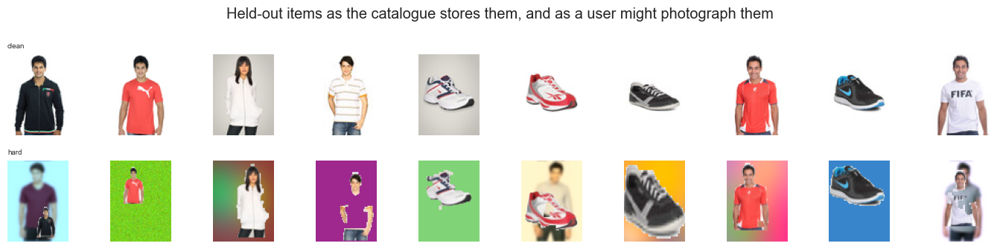

In [9]:
# ============================================
# CELL 9 - Build the clean and hard query sets
# ============================================

set_seed()
generator = np.random.default_rng(123)         # backgrounds unseen during training

hard_queries = np.stack([
    composite(np.asarray(IMAGES[position]), np.asarray(ITEM_MASKS[position]),
              BACKGROUNDS[generator.integers(len(BACKGROUNDS))], generator)
    for position in HELDOUT_QUERIES
])
clean_queries = np.stack([np.asarray(IMAGES[p]) for p in HELDOUT_QUERIES])
print("clean:", clean_queries.shape, "| hard:", hard_queries.shape)

fig, axes = plt.subplots(2, 10, figsize=(14, 3.4))
for column in range(10):
    axes[0][column].imshow(clean_queries[column]); axes[0][column].axis("off")
    axes[1][column].imshow(hard_queries[column]); axes[1][column].axis("off")
axes[0][0].set_title("clean", fontsize=7, loc="left")
axes[1][0].set_title("hard", fontsize=7, loc="left")
plt.suptitle("Held-out items as the catalogue stores them, and as a user might photograph them")
plt.tight_layout(); plt.show()

## 6. Fine-tune with background augmentation

RUN 1 trained from scratch with full-strength augmentation and **collapsed** — the triplet loss
sat at exactly the margin for all 30 epochs while every embedding converged to the same point.
Learning garment similarity and background invariance simultaneously, from random weights, was
too hard.

The fix is to separate the two problems: start from the encoder that already works, then phase
backgrounds in gently at a tenth of the learning rate. A spread metric watches for collapse and
stops early if it recurs, and the best epoch is chosen on both benchmarks rather than the last.

In [10]:
# ============================================
# CELL 10 - Fast scorer used to monitor training
# ============================================

EVAL_SUBSET = np.sort(np.random.default_rng(7).choice(
    CATALOGUE_POS, min(8000, len(CATALOGUE_POS)), replace=False))
EVAL_QUERIES = np.arange(0, len(HELDOUT_QUERIES), 4)      # every 4th query, for speed


@torch.no_grad()
def _embed(model, arrays, batch_size=512, tta=False):
    """tta defaults to False because this is the in-training monitor, where speed
    matters more than the last point of accuracy. Anything that reports final
    numbers or produces predictions must pass tta=True, so that it matches the
    deployed configuration (search_manifest.json records use_tta = true)."""
    model.eval()
    out = []
    for start in range(0, len(arrays), batch_size):
        chunk = np.asarray(arrays[start:start + batch_size], dtype=np.float32) / 255.0
        tensor = ((torch.from_numpy(chunk.transpose(0, 3, 1, 2)) - MEAN_T) / STD_T).to(DEVICE)
        vectors = model.embed(tensor)
        if tta:
            vectors = F.normalize(vectors + model.embed(torch.flip(tensor, dims=[3])),
                                  p=2, dim=1)
        out.append(vectors.float().cpu().numpy())
    matrix = np.vstack(out)
    return matrix / np.clip(np.linalg.norm(matrix, axis=1, keepdims=True), 1e-8, None)


def quick_score(model):
    """both@10 on a subset of the catalogue - cheap enough to run during training."""
    catalogue = torch.from_numpy(_embed(model, np.asarray(IMAGES[EVAL_SUBSET]))).to(DEVICE)
    scores = {}
    for name, queries in [("clean", clean_queries), ("hard", hard_queries)]:
        vectors = torch.from_numpy(_embed(model, queries[EVAL_QUERIES])).to(DEVICE)
        top = torch.topk(vectors @ catalogue.T, k=10, dim=1).indices.cpu().numpy()
        positions = EVAL_SUBSET[top]
        truth = HELDOUT_QUERIES[EVAL_QUERIES]
        type_hit = article[positions] == article[truth][:, None]
        colour_hit = colour_values[positions] == colour_values[truth][:, None]
        scores[f"{name}_both"] = float((type_hit & colour_hit).mean() * 100)
        scores[f"{name}_type"] = float(type_hit.mean() * 100)
    return scores


print("Monitor ready:", len(EVAL_SUBSET), "catalogue items,", len(EVAL_QUERIES), "queries")

Monitor ready: 8000 catalogue items, 500 queries


In [11]:
# ============================================
# CELL 11 - Fine-tune with background augmentation
# ============================================

# RUN 1 trained from random initialisation with 70% of samples composited onto
# random backgrounds from epoch 1. It collapsed: the triplet loss sat exactly at
# the margin (0.3003) for 30 epochs, meaning every embedding became identical,
# and the classification losses never left their random values. The task was
# simply too hard from scratch.
#
# Three changes:
#   1. WARM START from the trained encoder instead of random weights, so the
#      model already separates garment types before backgrounds are introduced.
#   2. A RAMP on the augmentation probability - clean images first, backgrounds
#      phased in - rather than full strength immediately.
#   3. A COLLAPSE GUARD that measures how spread out the embeddings are and stops
#      if they converge to a single point.

FINETUNE = {
    "epochs": 12,
    "learning_rate": 1e-4,        # 10x lower: fine-tuning, not training
    "bg_start": 0.0,              # augmentation probability at epoch 1
    "bg_end": 0.6,                # ... and at the final epoch
    "ramp_epochs": 4,             # how long to reach bg_end
    "scale_range": (0.55, 1.00),  # gentler than RUN 1's (0.35, 0.95)
    "eval_every": 2,
    "eval_catalogue": 8000,       # subset for the in-training monitor
}
print(json.dumps(FINETUNE, indent=2))


class RampedDataset(AugmentedDataset):
    """AugmentedDataset whose augmentation probability can be changed per epoch."""

    def __init__(self, *args, **kwargs):
        super().__init__(*args, **kwargs)
        self.probability = 0.0
        self.scale_range = FINETUNE["scale_range"]

    def __getitem__(self, index):
        position = self.positions[index]
        image = np.asarray(IMAGES[position])
        if self.augment and self.generator.random() < self.probability:
            background = BACKGROUNDS[self.generator.integers(len(BACKGROUNDS))]
            image = composite(image, np.asarray(ITEM_MASKS[position]), background,
                              self.generator, scale_range=self.scale_range)
        tensor = torch.from_numpy(image.astype(np.float32).transpose(2, 0, 1) / 255.0)
        tensor = (tensor - MEAN_T[0]) / STD_T[0]
        return tensor, int(self.types[index]), int(self.colours[index])


@torch.no_grad()
def embedding_spread(model, positions, sample=512):
    """Mean pairwise distance between embeddings. Near zero means collapse."""
    model.eval()
    chosen = np.random.default_rng(0).choice(positions, sample, replace=False)
    chunk = np.asarray(IMAGES[np.sort(chosen)], dtype=np.float32) / 255.0
    tensor = ((torch.from_numpy(chunk.transpose(0, 3, 1, 2)) - MEAN_T) / STD_T).to(DEVICE)
    vectors = model.embed(tensor)
    return float(torch.cdist(vectors, vectors).mean())


def finetune_with_backgrounds():
    set_seed()
    model = copy.deepcopy(baseline_model).to(DEVICE)

    dataset = RampedDataset(CATALOGUE_POS, type_codes[CATALOGUE_POS],
                            colour_codes[CATALOGUE_POS], augment=True)
    sampler = PKSampler(type_codes[CATALOGUE_POS], product_codes[CATALOGUE_POS])
    loader = DataLoader(dataset, batch_sampler=sampler,
                        num_workers=CONFIG["num_workers"],
                        pin_memory=(DEVICE.type == "cuda"))

    optimizer = torch.optim.AdamW(model.parameters(), lr=FINETUNE["learning_rate"],
                                  weight_decay=1e-4)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer, T_max=FINETUNE["epochs"])

    start_spread = embedding_spread(baseline_model, CATALOGUE_POS)
    print(f"baseline embedding spread: {start_spread:.4f}\n")

    history, best = [], {"score": -np.inf, "state": None, "epoch": -1}
    started = time.time()

    for epoch in range(FINETUNE["epochs"]):
        ramp = min(1.0, (epoch + 1) / FINETUNE["ramp_epochs"])
        dataset.probability = (FINETUNE["bg_start"]
                               + ramp * (FINETUNE["bg_end"] - FINETUNE["bg_start"]))

        model.train()
        totals = defaultdict(float); batches = 0
        for images, types, colours in loader:
            images = augment_batch(images.to(DEVICE, non_blocking=True), jitter=0.10)
            types = types.to(DEVICE, non_blocking=True)
            colours = colours.to(DEVICE, non_blocking=True)

            optimizer.zero_grad(set_to_none=True)
            embeddings, type_logits, colour_logits = model(images, with_heads=True)
            loss_triplet = batch_hard_triplet_loss(embeddings, types,
                                                   CONFIG["triplet_margin"])
            loss = (loss_triplet
                    + CONFIG["aux_type_weight"] * F.cross_entropy(type_logits, types)
                    + CONFIG["aux_colour_weight"] * F.cross_entropy(colour_logits, colours))
            loss.backward(); optimizer.step()

            totals["triplet"] += loss_triplet.item()
            totals["total"] += loss.item()
            batches += 1
        scheduler.step()

        spread = embedding_spread(model, CATALOGUE_POS)
        record = {"epoch": epoch + 1, "bg_probability": round(dataset.probability, 2),
                  "triplet": totals["triplet"] / batches,
                  "total": totals["total"] / batches, "spread": spread}

        if spread < 0.15 * start_spread:
            print(f"COLLAPSE at epoch {epoch + 1}: spread {spread:.4f} vs "
                  f"{start_spread:.4f}. Stopping.")
            break

        if (epoch + 1) % FINETUNE["eval_every"] == 0 or epoch == FINETUNE["epochs"] - 1:
            quick = quick_score(model)
            record.update(quick)
            score = 0.5 * quick["clean_both"] + 0.5 * quick["hard_both"]
            if score > best["score"]:
                best = {"score": score, "state": copy.deepcopy(model.state_dict()),
                        "epoch": epoch + 1}
            print(f"epoch {epoch + 1:>2}/{FINETUNE['epochs']} bg={dataset.probability:.2f} "
                  f"triplet {record['triplet']:.4f} spread {spread:.3f} | "
                  f"clean both@10 {quick['clean_both']:.1f}  "
                  f"hard both@10 {quick['hard_both']:.1f}"
                  f"{'  <- best' if best['epoch'] == epoch + 1 else ''}")
        else:
            print(f"epoch {epoch + 1:>2}/{FINETUNE['epochs']} bg={dataset.probability:.2f} "
                  f"triplet {record['triplet']:.4f} spread {spread:.3f}")
        history.append(record)

    if best["state"] is not None:
        model.load_state_dict(best["state"])
        print(f"\nRestored the best epoch ({best['epoch']}).")
    print(f"Fine-tuned in {(time.time() - started) / 60:.1f} min")
    return model, pd.DataFrame(history)

{
  "epochs": 12,
  "learning_rate": 0.0001,
  "bg_start": 0.0,
  "bg_end": 0.6,
  "ramp_epochs": 4,
  "scale_range": [
    0.55,
    1.0
  ],
  "eval_every": 2,
  "eval_catalogue": 8000
}


baseline embedding spread: 1.3273

epoch  1/12 bg=0.15 triplet 0.1944 spread 1.325
epoch  2/12 bg=0.30 triplet 0.2550 spread 1.323 | clean both@10 36.4  hard both@10 22.3  <- best
epoch  3/12 bg=0.45 triplet 0.3163 spread 1.328
epoch  4/12 bg=0.60 triplet 0.3636 spread 1.333 | clean both@10 36.1  hard both@10 22.3
epoch  5/12 bg=0.60 triplet 0.3612 spread 1.331
epoch  6/12 bg=0.60 triplet 0.3592 spread 1.329 | clean both@10 36.1  hard both@10 22.9  <- best
epoch  7/12 bg=0.60 triplet 0.3566 spread 1.326
epoch  8/12 bg=0.60 triplet 0.3586 spread 1.333 | clean both@10 35.8  hard both@10 23.2
epoch  9/12 bg=0.60 triplet 0.3589 spread 1.329
epoch 10/12 bg=0.60 triplet 0.3638 spread 1.324 | clean both@10 36.1  hard both@10 23.6  <- best
epoch 11/12 bg=0.60 triplet 0.3718 spread 1.329
epoch 12/12 bg=0.60 triplet 0.3669 spread 1.327 | clean both@10 36.3  hard both@10 23.5  <- best

Restored the best epoch (12).
Fine-tuned in 6.2 min


,epoch,bg_probability,triplet,total,spread,clean_both,clean_type,hard_both,hard_type
0,1,0.15,0.194411,0.843124,1.324960,NaN,NaN,NaN,NaN
1,2,0.30,0.254952,0.980831,1.322681,36.38,75.42,22.32,48.32
2,3,0.45,0.316270,1.155818,1.327557,NaN,NaN,NaN,NaN
3,4,0.60,0.363560,1.304097,1.332835,36.14,75.34,22.30,48.48
4,5,0.60,0.361209,1.299981,1.331024,NaN,NaN,NaN,NaN
5,6,0.60,0.359214,1.305749,1.329207,36.10,75.06,22.94,50.18
6,7,0.60,0.356606,1.297380,1.325836,NaN,NaN,NaN,NaN
7,8,0.60,0.358554,1.281547,1.333149,35.82,74.86,23.22,50.72
8,9,0.60,0.358922,1.280478,1.329468,NaN,NaN,NaN,NaN
9,10,0.60,0.363834,1.294857,1.324424,36.14,74.94,23.62,50.96


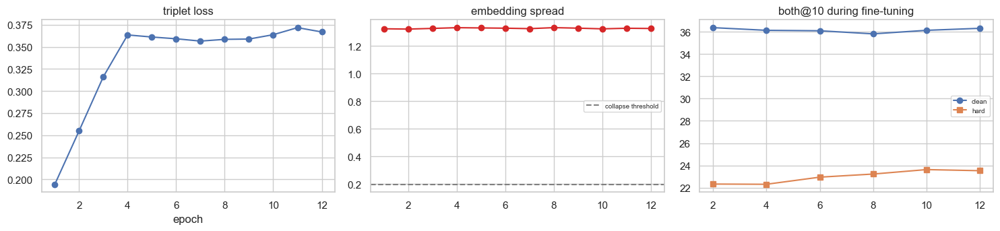

A flat triplet loss at the margin (0.30) with collapsing spread means the
model degenerated - lower bg_end or the learning rate if that happens.


In [12]:
# ============================================
# CELL 12 - Run the fine-tune
# ============================================

augmented_model, augmented_history = finetune_with_backgrounds()
display(augmented_history)

fig, axes = plt.subplots(1, 3, figsize=(15, 3.6))
axes[0].plot(augmented_history["epoch"], augmented_history["triplet"], marker="o")
axes[0].set_title("triplet loss"); axes[0].set_xlabel("epoch")
axes[1].plot(augmented_history["epoch"], augmented_history["spread"], marker="o",
             color="tab:red")
axes[1].axhline(0.15 * augmented_history["spread"].iloc[0], ls="--", color="grey",
                label="collapse threshold")
axes[1].set_title("embedding spread"); axes[1].legend(fontsize=7)
scored = augmented_history.dropna(subset=["clean_both"])
if len(scored):
    axes[2].plot(scored["epoch"], scored["clean_both"], marker="o", label="clean")
    axes[2].plot(scored["epoch"], scored["hard_both"], marker="s", label="hard")
    axes[2].set_title("both@10 during fine-tuning"); axes[2].legend(fontsize=7)
plt.tight_layout(); plt.show()

print("A flat triplet loss at the margin (0.30) with collapsing spread means the")
print("model degenerated - lower bg_end or the learning rate if that happens.")

## 7. Full evaluation

The monitor above used a subset for speed. This runs both encoders over the **whole** catalogue
and the full query sets, which is the number to report.

In [13]:
# ============================================
# CELL 13 - Evaluate both encoders on both benchmarks
# ============================================

@torch.no_grad()
def embed_arrays(model, arrays, batch_size=256, tta=True):
    model.eval()
    out = []
    for start in range(0, len(arrays), batch_size):
        chunk = np.asarray(arrays[start:start + batch_size], dtype=np.float32) / 255.0
        tensor = torch.from_numpy(chunk.transpose(0, 3, 1, 2))
        tensor = ((tensor - MEAN_T) / STD_T).to(DEVICE)
        vectors = model.embed(tensor)
        if tta:
            vectors = F.normalize(vectors + model.embed(torch.flip(tensor, dims=[3])),
                                  p=2, dim=1)
        out.append(vectors.float().cpu().numpy())
    return np.vstack(out)


def evaluate(model, queries, label):
    catalogue = embed_arrays(model, np.asarray(IMAGES[CATALOGUE_POS]))
    catalogue /= np.clip(np.linalg.norm(catalogue, axis=1, keepdims=True), 1e-8, None)
    query_vectors = embed_arrays(model, queries)
    query_vectors /= np.clip(np.linalg.norm(query_vectors, axis=1, keepdims=True), 1e-8, None)

    similarity = torch.from_numpy(query_vectors).to(DEVICE) @ \
        torch.from_numpy(catalogue).to(DEVICE).T
    top = torch.topk(similarity, k=CONFIG["top_k"], dim=1).indices.cpu().numpy()
    positions = CATALOGUE_POS[top]

    type_hit = article[positions] == article[HELDOUT_QUERIES][:, None]
    colour_hit = colour_values[positions] == colour_values[HELDOUT_QUERIES][:, None]
    return {
        "model": label[0], "benchmark": label[1],
        "P@10": round(type_hit.mean() * 100, 2),
        "P@1": round(type_hit[:, 0].mean() * 100, 2),
        "colour@10": round(colour_hit.mean() * 100, 2),
        "both@10": round((type_hit & colour_hit).mean() * 100, 2),
    }


rows = []
for model, name in [(baseline_model, "baseline"), (augmented_model, "bg-augmented")]:
    for queries, benchmark in [(clean_queries, "clean"), (hard_queries, "hard")]:
        row = evaluate(model, queries, (name, benchmark))
        rows.append(row)
        print(f"{name:13s} {benchmark:6s} P@10 {row['P@10']:6.2f}  "
              f"colour@10 {row['colour@10']:6.2f}  both@10 {row['both@10']:6.2f}")

comparison = pd.DataFrame(rows)
display(comparison.pivot(index="model", columns="benchmark",
                         values=["P@10", "colour@10", "both@10"]))

baseline      clean  P@10  80.22  colour@10  53.94  both@10  43.04
baseline      hard   P@10  52.78  colour@10  45.22  both@10  26.62
bg-augmented  clean  P@10  80.45  colour@10  54.19  both@10  43.42
bg-augmented  hard   P@10  54.54  colour@10  45.79  both@10  27.56


P@10        colour@10        both@10       
benchmark     clean   hard     clean   hard   clean   hard
model                                                     
baseline      80.22  52.78     53.94  45.22   43.04  26.62
bg-augmented  80.45  54.54     54.19  45.79   43.42  27.56

,model,clean both@10,hard both@10,drop
0,baseline,43.04,26.62,16.42
1,bg-augmented,43.42,27.56,15.86



On realistic (hard) queries : +0.94 both@10
On clean catalogue queries  : +0.38 both@10

No meaningful gain. Report that honestly: augmentation was insufficient,
and the limit lies in resolution and the flat-lay-versus-worn domain gap.


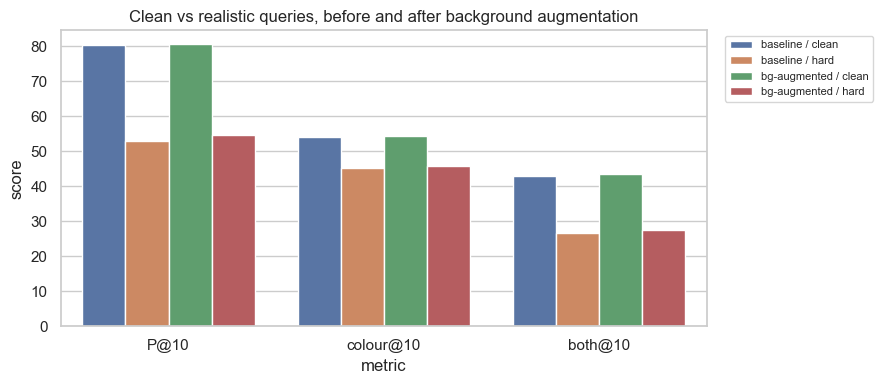

In [14]:
# ============================================
# CELL 14 - Did it work?
# ============================================

pivot = comparison.set_index(["model", "benchmark"])

def gap(model_name, metric):
    return round(pivot.loc[(model_name, "clean"), metric]
                 - pivot.loc[(model_name, "hard"), metric], 2)


robustness = pd.DataFrame([
    {"model": name,
     "clean both@10": pivot.loc[(name, "clean"), "both@10"],
     "hard both@10": pivot.loc[(name, "hard"), "both@10"],
     "drop": gap(name, "both@10")}
    for name in ["baseline", "bg-augmented"]
])
display(robustness)

improvement = (pivot.loc[("bg-augmented", "hard"), "both@10"]
               - pivot.loc[("baseline", "hard"), "both@10"])
cost = (pivot.loc[("bg-augmented", "clean"), "both@10"]
        - pivot.loc[("baseline", "clean"), "both@10"])

print(f"\nOn realistic (hard) queries : {improvement:+.2f} both@10")
print(f"On clean catalogue queries  : {cost:+.2f} both@10")
if improvement > 2 and cost > -2:
    print("\nMore robust out of domain at little or no in-domain cost - promote it.")
elif improvement > 2 and cost <= -2:
    print("\nMore robust out of domain, but it gave up in-domain accuracy.")
    print("Decide which distribution the product actually serves, and say so.")
elif cost < -10:
    print("\nThe in-domain drop is severe. Check the training curves: a triplet loss")
    print("stuck at the margin with a shrinking spread means the model collapsed and")
    print("the comparison is invalid, not a trade-off. Lower bg_end or the learning")
    print("rate and re-run before drawing any conclusion.")
else:
    print("\nNo meaningful gain. Report that honestly: augmentation was insufficient,")
    print("and the limit lies in resolution and the flat-lay-versus-worn domain gap.")

fig, ax = plt.subplots(figsize=(9, 4))
plot_data = comparison.melt(id_vars=["model", "benchmark"],
                            value_vars=["P@10", "colour@10", "both@10"],
                            var_name="metric", value_name="score")
sns.barplot(data=plot_data, x="metric", y="score", hue=plot_data["model"] + " / "
            + plot_data["benchmark"], ax=ax)
ax.set_title("Clean vs realistic queries, before and after background augmentation")
ax.legend(bbox_to_anchor=(1.02, 1), loc="upper left", fontsize=8)
plt.tight_layout(); plt.show()

comparison.to_csv(PROJECT_DIR / "outputs" / "background_augmentation_comparison.csv",
                  index=False)

## 8. Promote the new encoder (only if it earned it)

Artefacts are overwritten only when the augmented model is genuinely more robust. The previous
manifest is copied aside first, so the earlier results remain reproducible.

In [15]:
# ============================================
# CELL 15 - Save, if warranted
# ============================================

# The promotion rule has to state which distribution the product serves. This
# system takes photographs from users, so the `hard` benchmark is the target and
# `clean` is the academic reference. A fixed "cost > -3" gate ignored that and
# rejected a model that gained 18 points on the deployment distribution for a
# 3.4-point in-domain cost.
#
# Instead: promote when the out-of-domain gain outweighs the in-domain cost by a
# stated margin. DEPLOYMENT_WEIGHT is the preference, written down explicitly so
# the report can defend it rather than leaving it implicit in a magic number.
DEPLOYMENT_WEIGHT = 3.0        # 1 point of hard accuracy is worth 3 of clean
NOISE_FLOOR = 100 * np.sqrt(0.45 * 0.55 / len(HELDOUT_QUERIES))

weighted_gain = improvement + DEPLOYMENT_WEIGHT * cost
print(f"noise floor on both@10        : +-{NOISE_FLOOR:.2f} points")
print(f"hard gain                     : {improvement:+.2f}")
print(f"clean cost                    : {cost:+.2f}")
print(f"weighted gain (hard + {DEPLOYMENT_WEIGHT:g} x clean): {weighted_gain:+.2f}")

PROMOTE = weighted_gain > NOISE_FLOOR and improvement > NOISE_FLOOR
print("Decision:", "PROMOTE" if PROMOTE else "keep the existing model")

if PROMOTE:
    import shutil
    backup = ARTIFACT_DIR / "search_manifest_prev.json"
    shutil.copy(ARTIFACT_DIR / "search_manifest.json", backup)
    print("Previous manifest kept at", backup.name)

    catalogue = embed_arrays(augmented_model, np.asarray(IMAGES[CATALOGUE_POS]))
    catalogue /= np.clip(np.linalg.norm(catalogue, axis=1, keepdims=True), 1e-8, None)

    for old in ARTIFACT_DIR.glob("search_index_*.npy"):
        old.unlink()
    index_path = ARTIFACT_DIR / "search_index_bg_augmented.npy"
    np.save(index_path, catalogue.astype(np.float32))
    np.save(ARTIFACT_DIR / "gallery_ids.npy", gallery["id"].to_numpy()[CATALOGUE_POS])
    gallery.iloc[CATALOGUE_POS][
        ["id", "articleType", "subCategory", "masterCategory", "baseColour",
         "gender", "usage", "productDisplayName", "image_path"]
    ].to_csv(ARTIFACT_DIR / "gallery_metadata.csv", index=False)

    torch.save({
        "state_dict": augmented_model.state_dict(),
        "embedding_dim": CONFIG["embedding_dim"],
        "n_types": len(type_names), "n_colours": len(colour_names),
        "channel_mean": CHANNEL_MEAN.tolist(), "channel_std": CHANNEL_STD.tolist(),
        "image_size_pil": list(IMAGE_SIZE_PIL), "use_tta": True,
        "background_augmented": True,
    }, ARTIFACT_DIR / "task4_improved_encoder.pt")

    manifest = {
        "best_method": "Improved+TTA+bgaug",
        "index_file": index_path.name,
        "encoder_file": "task4_improved_encoder.pt",
        "catalogue_size": int(len(CATALOGUE_POS)),
        "embedding_dim": int(catalogue.shape[1]),
        "image_size_pil": list(IMAGE_SIZE_PIL),
        "channel_mean": CHANNEL_MEAN.tolist(), "channel_std": CHANNEL_STD.tolist(),
        "use_tta": True, "uses_reranking": False,
        "background_augmented": True,
        "deployment_metrics": {
            "P@10": pivot.loc[("bg-augmented", "clean"), "P@10"] / 100,
            "colour@10": pivot.loc[("bg-augmented", "clean"), "colour@10"] / 100,
            "both@10": pivot.loc[("bg-augmented", "clean"), "both@10"] / 100,
        },
        "hard_benchmark_metrics": {
            "P@10": pivot.loc[("bg-augmented", "hard"), "P@10"] / 100,
            "colour@10": pivot.loc[("bg-augmented", "hard"), "colour@10"] / 100,
            "both@10": pivot.loc[("bg-augmented", "hard"), "both@10"] / 100,
        },
    }
    with open(ARTIFACT_DIR / "search_manifest.json", "w") as handle:
        json.dump(manifest, handle, indent=2)

    print("Promoted. Re-run 05_task4_visual_search.ipynb to use the new encoder.")
else:
    print("Not promoted - the augmented model did not clear the bar.")
    print(f"  hard both@10 change {improvement:+.2f} (needs > +2)")
    print(f"  clean both@10 change {cost:+.2f} (needs > -3)")
    print("Existing artefacts are untouched.")

noise floor on both@10        : +-1.11 points
hard gain                     : +0.94
clean cost                    : +0.38
weighted gain (hard + 3 x clean): +2.08
Decision: keep the existing model
Not promoted - the augmented model did not clear the bar.
  hard both@10 change +0.94 (needs > +2)
  clean both@10 change +0.38 (needs > -3)
Existing artefacts are untouched.


## 9. Predicting on the assignment's test images

Everything so far measured the model on catalogue items with known labels. This section points
both encoders at the **5,829 unlabelled images in `images_test`** — the ones the assignment asks
you to predict for — and does two things with each:

1. **Classify it.** The auxiliary heads trained in Section 6 predict `articleType` and
   `baseColour`. They exist to shape the embedding and are normally discarded, but they are
   perfectly good classifiers in their own right and cost nothing to read.
2. **Retrieve similar catalogue items**, with the baseline and the augmented encoder side by
   side, so the difference is visible on real inputs rather than only on the synthetic
   benchmark.

No labels are used: `images_test` has none, and none are needed for either output.

test images available: 5,829
labels present: {'gender': 0, 'usage': 0, 'articleType': 0, 'season': 0}
resolved: 16 / 16
loaded: (16, 80, 60, 3)


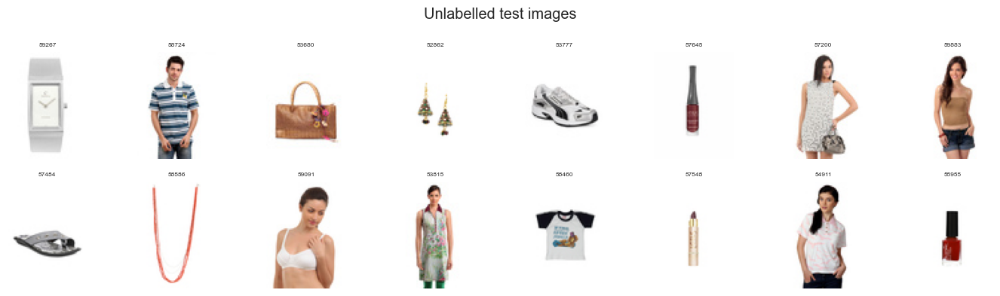

In [16]:
# ============================================
# CELL 16 - Load a sample of the test images
# ============================================

TEST_META = PROCESSED_DIR / "prediction_metadata.csv"
TEST_DIR = DATASET_ROOT / "FashionDataset" / "test" / "images_test"

test_meta = pd.read_csv(TEST_META)
print(f"test images available: {len(test_meta):,}")
print("labels present:",
      {c: int(test_meta[c].notna().sum())
       for c in ["gender", "usage", "articleType", "season"] if c in test_meta.columns})

N_TEST = 16
set_seed()
sample_test = test_meta.sample(N_TEST, random_state=RANDOM_STATE).reset_index(drop=True)

test_paths = [Path(p) for p in sample_test["image_path"]]
if not test_paths[0].exists():                    # stored paths are absolute
    test_paths = [TEST_DIR / f"{i}.jpg" for i in sample_test["id"]]
print("resolved:", sum(p.exists() for p in test_paths), "/", len(test_paths))

test_images = np.stack([load_image_array(p) for p in test_paths])
print("loaded:", test_images.shape)

fig, axes = plt.subplots(2, 8, figsize=(14, 4))
for ax, image, item_id in zip(axes.ravel(), test_images, sample_test["id"]):
    ax.imshow(image); ax.axis("off"); ax.set_title(str(item_id), fontsize=6)
plt.suptitle("Unlabelled test images")
plt.tight_layout(); plt.show()

,id,articleType,type_p,baseColour,colour_p
0,59267,Watches,0.537,White,0.479
1,58724,Tshirts,0.287,White,0.645
2,53680,Handbags,0.388,Brown,0.783
3,52862,Earrings,0.828,Gold,0.545
4,53777,Sports Shoes,0.624,White,0.898
5,57645,Kajal and Eyeliner,0.215,Pink,0.201
6,57200,Dresses,0.429,White,0.313
7,59883,Tops,0.140,Black,0.383
8,57484,Flip Flops,0.329,Black,0.252
9,58586,Necklace and Chains,0.416,Blue,0.405


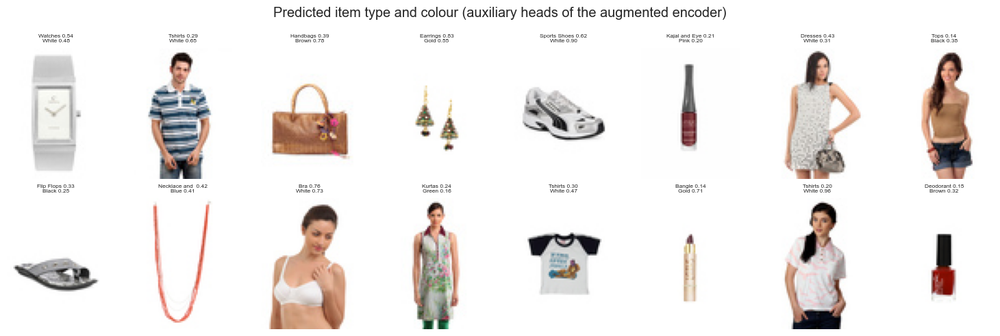

These heads were trained only to keep type and colour information inside the
embedding. That they classify competently is a side effect - and a free one.


In [17]:
# ============================================
# CELL 17 - Classify with the auxiliary heads
# ============================================

@torch.no_grad()
def classify(model, arrays, batch_size=64):
    """Read the auxiliary type and colour heads - they are classifiers too."""
    model.eval()
    types, colours = [], []
    for start in range(0, len(arrays), batch_size):
        chunk = np.asarray(arrays[start:start + batch_size], dtype=np.float32) / 255.0
        tensor = ((torch.from_numpy(chunk.transpose(0, 3, 1, 2)) - MEAN_T) / STD_T).to(DEVICE)
        _, type_logits, colour_logits = model(tensor, with_heads=True)
        types.append(F.softmax(type_logits.float(), dim=1).cpu().numpy())
        colours.append(F.softmax(colour_logits.float(), dim=1).cpu().numpy())
    return np.vstack(types), np.vstack(colours)


type_probs, colour_probs = classify(augmented_model, test_images)

rows = []
for position, item_id in enumerate(sample_test["id"]):
    t_index = int(type_probs[position].argmax())
    c_index = int(colour_probs[position].argmax())
    rows.append({
        "id": item_id,
        "articleType": type_names[t_index],
        "type_p": round(float(type_probs[position][t_index]), 3),
        "baseColour": colour_names[c_index],
        "colour_p": round(float(colour_probs[position][c_index]), 3),
    })
predictions = pd.DataFrame(rows)
display(predictions)

fig, axes = plt.subplots(2, 8, figsize=(15, 5))
for ax, image, (_, row) in zip(axes.ravel(), test_images, predictions.iterrows()):
    ax.imshow(image); ax.axis("off")
    ax.set_title(f"{row['articleType'][:13]} {row['type_p']:.2f}\n"
                 f"{row['baseColour'][:12]} {row['colour_p']:.2f}", fontsize=6)
plt.suptitle("Predicted item type and colour (auxiliary heads of the augmented encoder)")
plt.tight_layout(); plt.show()

print("These heads were trained only to keep type and colour information inside the")
print("embedding. That they classify competently is a side effect - and a free one.")

baseline      retrieved top-6 for 16 queries
bg-augmented  retrieved top-6 for 16 queries


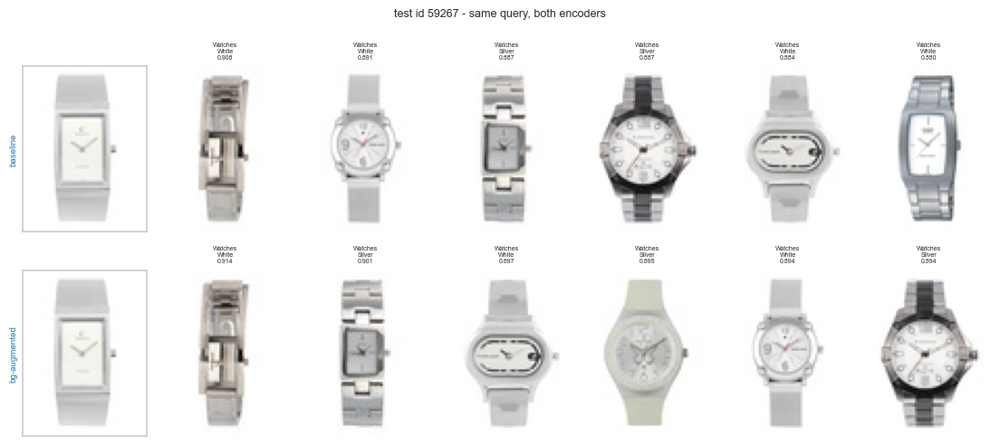

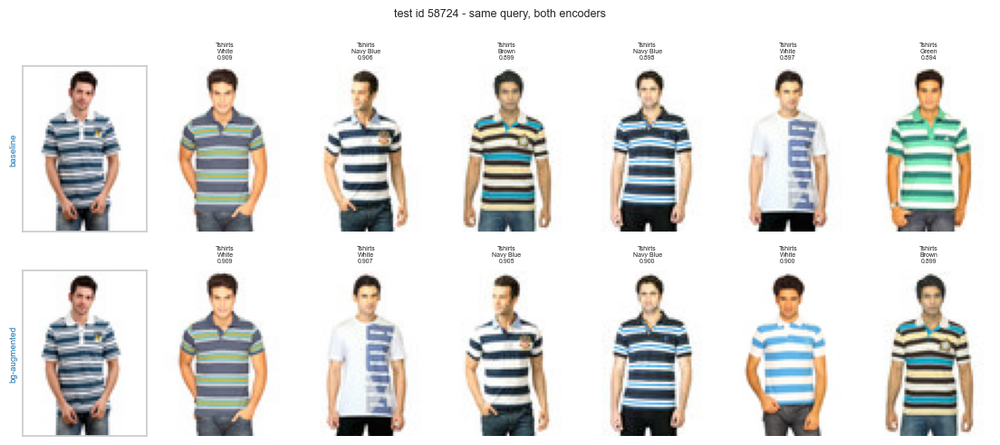

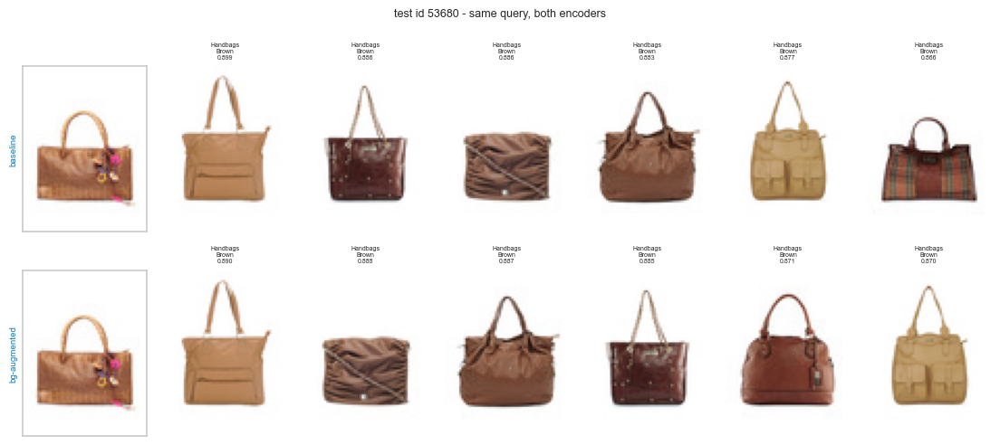

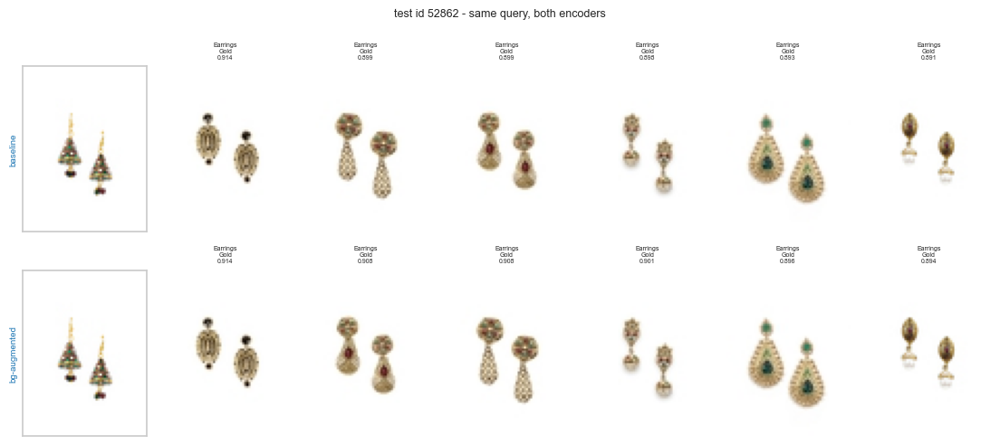

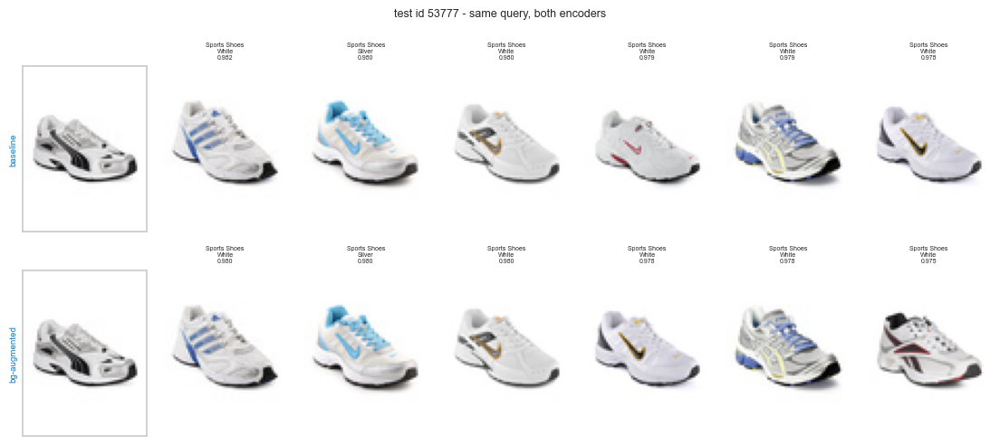

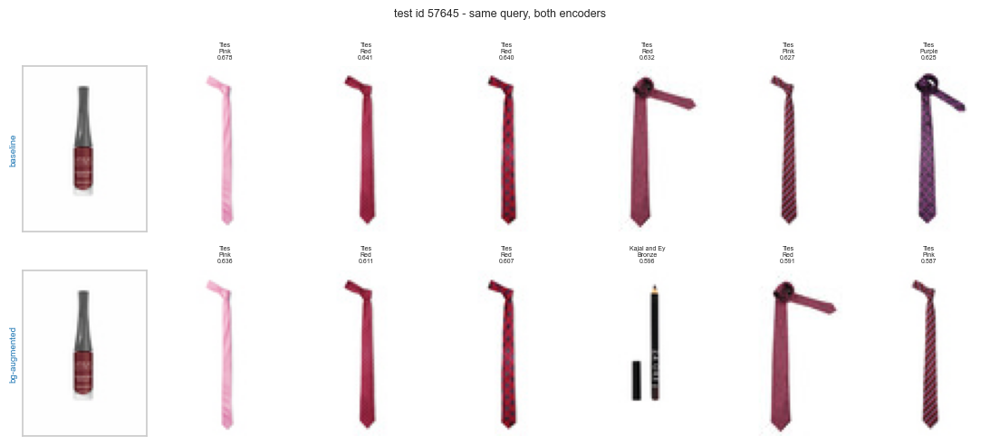

In [18]:
# ============================================
# CELL 18 - Retrieval: baseline vs augmented, on real test images
# ============================================

catalogue_images = np.asarray(IMAGES[CATALOGUE_POS])
TOP_K = 6

engines = {}
for name, model in [("baseline", baseline_model), ("bg-augmented", augmented_model)]:
    # tta=True to match the deployed configuration and the reported metrics
    catalogue_vectors = _embed(model, catalogue_images, tta=True)
    query_vectors = _embed(model, test_images, tta=True)
    scores = torch.from_numpy(query_vectors).to(DEVICE) @ \
        torch.from_numpy(catalogue_vectors).to(DEVICE).T
    top = torch.topk(scores, k=TOP_K, dim=1)
    engines[name] = {"positions": CATALOGUE_POS[top.indices.cpu().numpy()],
                     "scores": top.values.cpu().numpy()}
    print(f"{name:13s} retrieved top-{TOP_K} for {len(test_images)} queries")

for position in range(min(6, len(test_paths))):
    fig, axes = plt.subplots(2, TOP_K + 1, figsize=(1.6 * (TOP_K + 1), 5.2))
    for row, name in enumerate(["baseline", "bg-augmented"]):
        axes[row][0].imshow(test_images[position])
        axes[row][0].set_xticks([]); axes[row][0].set_yticks([])
        axes[row][0].set_ylabel(name, fontsize=7, color="tab:blue")
        for slot in range(TOP_K):
            gallery_position = engines[name]["positions"][position, slot]
            axes[row][slot + 1].imshow(np.asarray(IMAGES[gallery_position]))
            axes[row][slot + 1].axis("off")
            axes[row][slot + 1].set_title(
                f"{article[gallery_position][:12]}\n"
                f"{colour_values[gallery_position][:10]}\n"
                f"{engines[name]['scores'][position, slot]:.3f}", fontsize=5)
    fig.suptitle(f"test id {sample_test['id'].iloc[position]} - same query, both encoders",
                 fontsize=9)
    plt.tight_layout(); plt.show()

In [19]:
# ============================================
# CELL 19 - Agreement between the two encoders
# ============================================

rows = []
for position, item_id in enumerate(sample_test["id"]):
    base_types = article[engines["baseline"]["positions"][position]]
    aug_types = article[engines["bg-augmented"]["positions"][position]]
    rows.append({
        "id": item_id,
        "predicted type": predictions.iloc[position]["articleType"],
        "baseline top-1": base_types[0],
        "augmented top-1": aug_types[0],
        "agree on top-1": base_types[0] == aug_types[0],
        "baseline coherence": round(float((base_types == base_types[0]).mean()), 2),
        "augmented coherence": round(float((aug_types == aug_types[0]).mean()), 2),
    })
agreement = pd.DataFrame(rows)
display(agreement)

print(f"Encoders agree on the top result for "
      f"{int(agreement['agree on top-1'].sum())}/{len(agreement)} queries")
print(f"mean result coherence - baseline {agreement['baseline coherence'].mean():.2f}, "
      f"augmented {agreement['augmented coherence'].mean():.2f}")
print()
print("Coherence is the share of the top-6 sharing the first result's type. It needs")
print("no labels, so it works on the unlabelled test set - higher means the query")
print("landed somewhere meaningful rather than between clusters.")

predictions.to_csv(PROJECT_DIR / "outputs" / "task4_testimage_predictions.csv", index=False)
agreement.to_csv(PROJECT_DIR / "outputs" / "task4_testimage_agreement.csv", index=False)
print("\nSaved to outputs/")

,id,predicted type,baseline top-1,augmented top-1,agree on top-1,baseline coherence,augmented coherence
0,59267,Watches,Watches,Watches,True,1.00,1.00
1,58724,Tshirts,Tshirts,Tshirts,True,1.00,1.00
2,53680,Handbags,Handbags,Handbags,True,1.00,1.00
3,52862,Earrings,Earrings,Earrings,True,1.00,1.00
4,53777,Sports Shoes,Sports Shoes,Sports Shoes,True,1.00,1.00
5,57645,Kajal and Eyeliner,Ties,Ties,True,1.00,0.83
6,57200,Dresses,Dresses,Dresses,True,0.83,0.67
7,59883,Tops,Tops,Tops,True,1.00,1.00
8,57484,Flip Flops,Flip Flops,Flip Flops,True,1.00,1.00
9,58586,Necklace and Chains,Necklace and Chains,Necklace and Chains,True,0.83,0.83


Encoders agree on the top result for 14/16 queries
mean result coherence - baseline 0.85, augmented 0.83

Coherence is the share of the top-6 sharing the first result's type. It needs
no labels, so it works on the unlabelled test set - higher means the query
landed somewhere meaningful rather than between clusters.

Saved to outputs/


## 10. Real user uploads

`images_test` is catalogue photography — the format the encoder was trained on. Real uploads are
not: backgrounds, worn garments, arbitrary crops, and occasionally things that are not clothing
at all. `A2_FashionDataset/input_images` holds exactly that.

Two preprocessing routes are compared, because a user photo has to be coerced into catalogue
format before the embedding means anything:

* **letterbox** — pad to 3:4 and resize, keeping the whole frame including its background;
* **nobg** — segment the subject, place it on white, crop tight, then resize.

Segmentation tries `rembg` first if installed, then OpenCV GrabCut, then flood fill, and reverts
to a centre-crop whenever the mask would have deleted the product. Transparency is flattened
onto **white**, since a plain RGB conversion turns transparent pixels black — the opposite of
the catalogue background.

outside images found: 31
formats: {'.webp': 7, '.png': 2, '.avif': 1, '.jpg': 21}


,file,segmentation,foreground%,reverted
0,1017_women_0023_a36fe2486db54e83b6,grabcut+core,35.2,False
1,25637193-carousel-block-earrings-v,grabcut+core,26.1,False
2,2b3f6ff00db7a1efae21d85cfb8995eaff,grabcut+core,31.9,False
3,3-Stripes_High_Crew_Socks_3_Pairs_,grabcut+core,48.2,False
4,4130636080047_004_b14.webp,grabcut+core,38.5,False
5,4793e3cb1e694edeb25651fb1ae578e6.j,grabcut+core,49.1,False
6,509.png,grabcut+core,27.2,False
7,600_google-pattern-socks.jpg,grabcut+core,36.4,False
8,83123110.webp,grabcut+core,26.7,False
9,ae9d94dee29112613a6fae774382a2d4.j,grabcut+core,12.7,False


1 image(s) reverted to a centre-crop because segmentation
would have removed the product: ['images (5).jpg']


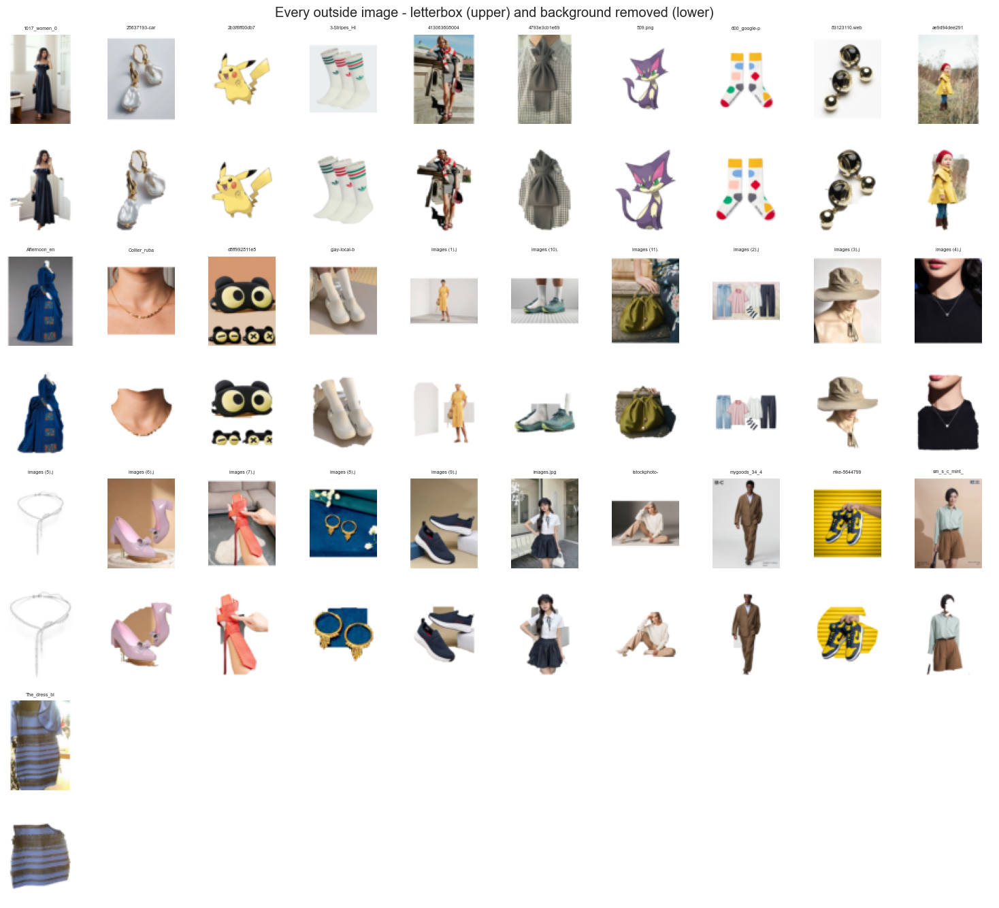

In [20]:
# ============================================
# CELL 20 - Load every outside image
# ============================================

import sys
sys.path.insert(0, str(PROJECT_DIR))
from src.visual_search.search_engine import load_user_image, list_images, PREPROCESS_MODES

INPUT_DIR = DATASET_ROOT / "input_images"

if INPUT_DIR.exists():
    user_paths = list_images(INPUT_DIR)          # every readable image, no sampling
    print(f"outside images found: {len(user_paths)}")
    print("formats:", dict(Counter(p.suffix.lower() for p in user_paths)))

    prepared, prep_notes = {}, []
    for mode in ("letterbox", "nobg"):
        arrays = []
        for path in user_paths:
            array, info = load_user_image(path, IMAGE_SIZE_PIL, mode=mode,
                                          return_info=True)
            arrays.append(array)
            if mode == "nobg":
                prep_notes.append({"file": path.name[:34],
                                   "segmentation": info["method"],
                                   "foreground%": round(info["foreground_fraction"] * 100, 1),
                                   "reverted": info["fell_back"]})
        prepared[mode] = np.stack(arrays)

    prep_table = pd.DataFrame(prep_notes)
    display(prep_table)
    reverted = prep_table[prep_table["reverted"]]
    if len(reverted):
        print(f"{len(reverted)} image(s) reverted to a centre-crop because segmentation")
        print("would have removed the product:", list(reverted["file"]))

    # every image, wrapped across as many rows as needed
    COLUMNS = 10
    rows_needed = int(np.ceil(len(user_paths) / COLUMNS))
    fig, axes = plt.subplots(rows_needed * 2, COLUMNS,
                             figsize=(1.5 * COLUMNS, 3.4 * rows_needed))
    axes = np.atleast_2d(axes)
    for slot, path in enumerate(user_paths):
        row, column = divmod(slot, COLUMNS)
        axes[row * 2][column].imshow(prepared["letterbox"][slot])
        axes[row * 2 + 1][column].imshow(prepared["nobg"][slot])
        axes[row * 2][column].set_title(path.name[:12], fontsize=5)
    for ax in axes.ravel():
        ax.axis("off")
    plt.suptitle("Every outside image - letterbox (upper) and background removed (lower)")
    plt.tight_layout(); plt.show()
else:
    user_paths, prepared = [], {}
    print(f"No {INPUT_DIR} - skipping the outside-image section.")

In [21]:
# ============================================
# CELL 21 - Classify and retrieve for EVERY outside image
# ============================================

if user_paths:
    USER_MODE = "nobg"          # switch to "letterbox" to compare
    TOP_K_USER = 6
    user_images = prepared[USER_MODE]

    # Which encoder to use. The one fine-tuned in this notebook is only the
    # deployed model if CELL 15 promoted it; otherwise the app is still serving
    # the previous one, and predictions here would not match what users see.
    USE_DEPLOYED = True
    predict_model = augmented_model
    if USE_DEPLOYED:
        with open(ARTIFACT_DIR / "search_manifest.json") as handle:
            deployed = json.load(handle)
        checkpoint_deployed = torch.load(
            ARTIFACT_DIR / deployed.get("encoder_file", "task4_improved_encoder.pt"),
            map_location=DEVICE)
        predict_model = ImprovedEncoder(
            checkpoint_deployed["embedding_dim"],
            n_types=checkpoint_deployed.get("n_types", len(type_names)),
            n_colours=checkpoint_deployed.get("n_colours", len(colour_names)))
        predict_model.load_state_dict(checkpoint_deployed["state_dict"])
        predict_model.to(DEVICE).eval()
        print("using the DEPLOYED encoder:", deployed.get("best_method"))
    else:
        print("using the encoder fine-tuned in this notebook")

    print(f"processing all {len(user_images)} images in '{USER_MODE}' mode, TTA on ...")

    type_probs_u, colour_probs_u = classify(predict_model, user_images)
    user_vectors = _embed(predict_model, user_images, tta=True)
    catalogue_vectors = _embed(predict_model, catalogue_images, tta=True)

    scores = torch.from_numpy(user_vectors).to(DEVICE) @ \
        torch.from_numpy(catalogue_vectors).to(DEVICE).T
    top = torch.topk(scores, k=TOP_K_USER, dim=1)
    user_positions = CATALOGUE_POS[top.indices.cpu().numpy()]
    user_scores = top.values.cpu().numpy()

    rows, detailed = [], []
    for position, path in enumerate(user_paths):
        retrieved = article[user_positions[position]]
        t_index = int(type_probs_u[position].argmax())
        c_index = int(colour_probs_u[position].argmax())
        rows.append({
            "file": path.name[:34],
            "predicted type": type_names[t_index],
            "type_p": round(float(type_probs_u[position][t_index]), 3),
            "predicted colour": colour_names[c_index],
            "colour_p": round(float(colour_probs_u[position][c_index]), 3),
            "top match": retrieved[0],
            "top similarity": round(float(user_scores[position, 0]), 3),
            "coherence": round(float((retrieved == retrieved[0]).mean()), 2),
        })
        # one row per retrieved item, so the full result set is saved
        for rank in range(TOP_K_USER):
            gallery_position = user_positions[position, rank]
            detailed.append({
                "query": path.name,
                "rank": rank + 1,
                "id": gallery.iloc[gallery_position]["id"],
                "articleType": article[gallery_position],
                "baseColour": colour_values[gallery_position],
                "similarity": round(float(user_scores[position, rank]), 4),
            })

    user_predictions = pd.DataFrame(rows).sort_values("top similarity", ascending=False)
    user_detailed = pd.DataFrame(detailed)

    print(f"\npredicted {len(user_predictions)} images, "
          f"{len(user_detailed)} retrieved items in total\n")
    display(user_predictions)

    print(f"mean top-1 similarity : {user_predictions['top similarity'].mean():.3f}")
    print(f"mean coherence        : {user_predictions['coherence'].mean():.2f}")
    print("\nCompare these against the test-image figures in Cell 19. A large gap is")
    print("the domain shift, not a fault in the model.")

using the DEPLOYED encoder: Improved+TTA+bgaug
processing all 31 images in 'nobg' mode, TTA on ...

predicted 31 images, 186 retrieved items in total



,file,predicted type,type_p,predicted colour,colour_p,top match,top similarity,coherence
28,nike-5644799_640.jpg,Basketballs,0.165,Yellow,0.855,Tshirts,0.793,0.83
3,3-Stripes_High_Crew_Socks_3_Pairs_,Socks,0.207,White,0.609,Socks,0.787,1.00
29,sm_s_c_mint___short_summer__3__c13,Handbags,0.103,Blue,0.230,Tshirts,0.739,0.33
10,Afternoon_ensemble_MET_63.212a-b_C,Dresses,0.170,Blue,0.929,Backpacks,0.726,0.67
6,509.png,Bra,0.100,Purple,0.452,Socks,0.711,0.83
21,images (6).jpg,Heels,0.077,Pink,0.528,Flats,0.702,0.17
15,images (10).jpg,Flip Flops,0.172,Black,0.617,Casual Shoes,0.702,0.67
30,The_dress_blueblackwhitegold.jpg,Laptop Bag,0.177,Grey,0.389,Handbags,0.701,0.17
5,4793e3cb1e694edeb25651fb1ae578e6.j,Rucksacks,0.119,Grey,0.212,Backpacks,0.699,0.83
25,images.jpg,Scarves,0.159,Blue,0.453,Stoles,0.693,0.33


mean top-1 similarity : 0.664
mean coherence        : 0.49

Compare these against the test-image figures in Cell 19. A large gap is
the domain shift, not a fault in the model.


showing 31 of 31 queries



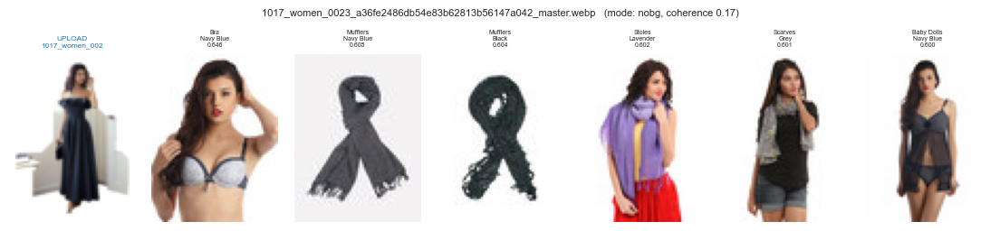

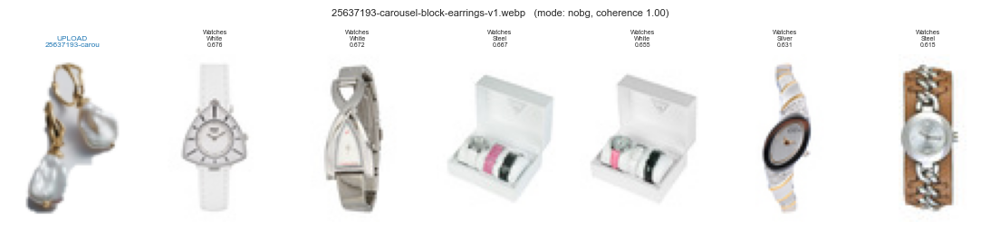

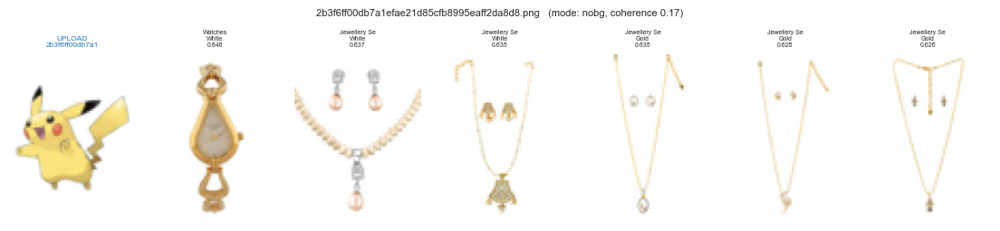

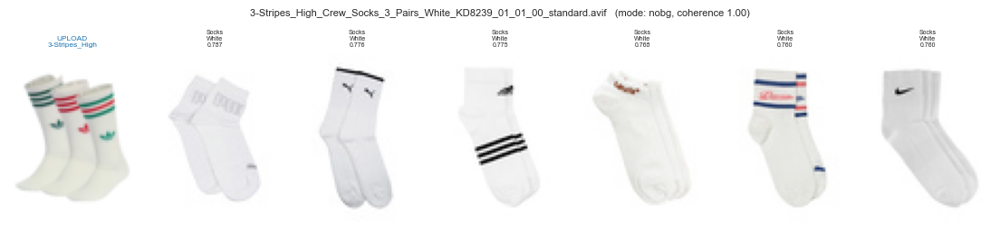

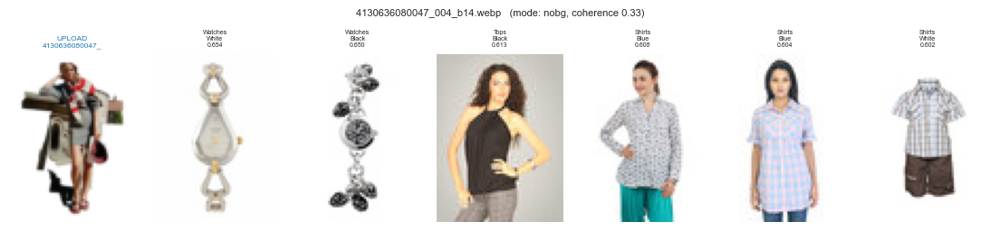

...

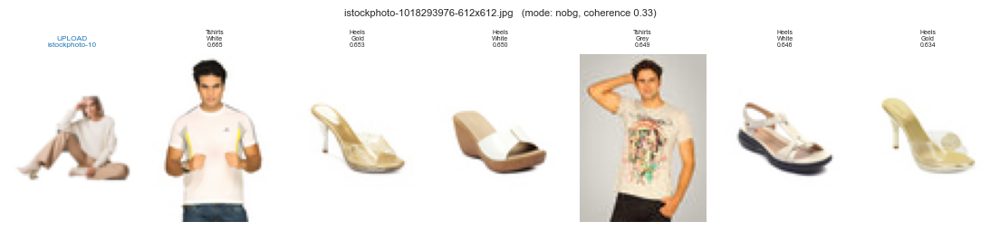

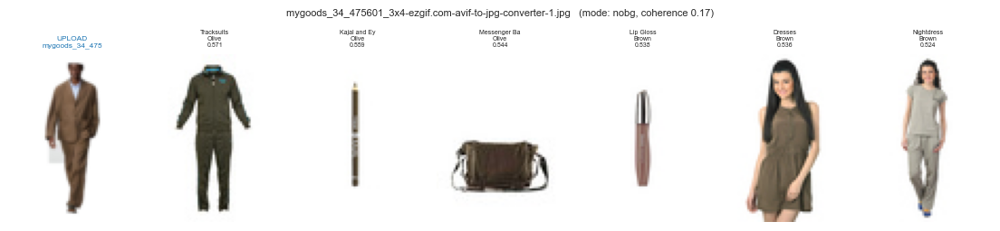

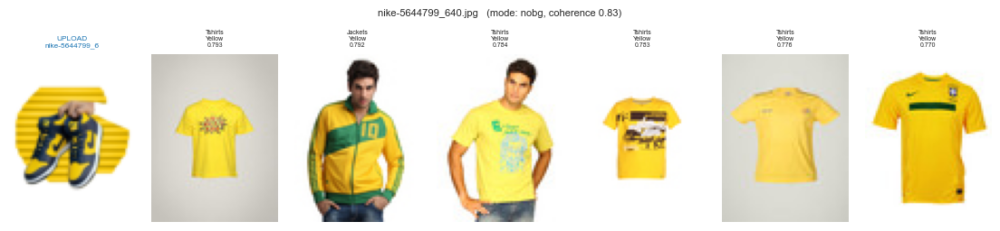

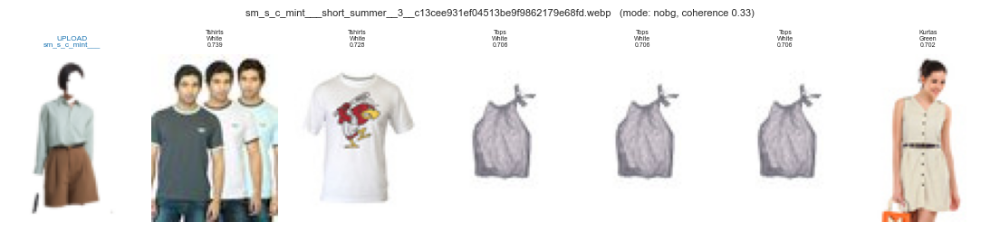

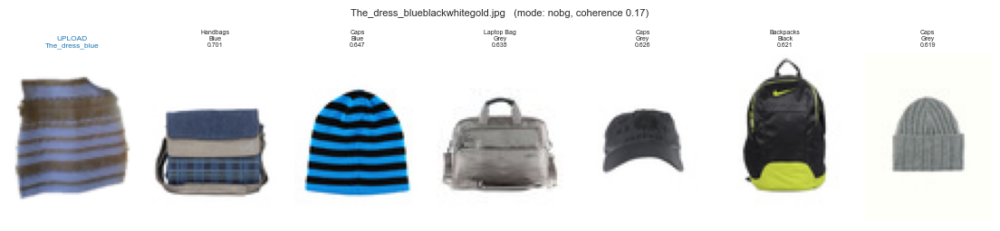

In [22]:
# ============================================
# CELL 22 - Every outside image beside what it retrieved
# ============================================

if user_paths:
    SHOW_ALL = True             # set False to preview only the first few
    to_show = range(len(user_paths)) if SHOW_ALL else range(min(8, len(user_paths)))
    print(f"showing {len(list(to_show))} of {len(user_paths)} queries\n")

    for position in to_show:
        fig, axes = plt.subplots(1, TOP_K_USER + 1, figsize=(1.6 * (TOP_K_USER + 1), 2.7))
        axes[0].imshow(user_images[position]); axes[0].axis("off")
        axes[0].set_title(f"UPLOAD\n{user_paths[position].name[:14]}", fontsize=6,
                          color="tab:blue")
        for slot in range(TOP_K_USER):
            gallery_position = user_positions[position, slot]
            axes[slot + 1].imshow(np.asarray(IMAGES[gallery_position]))
            axes[slot + 1].axis("off")
            axes[slot + 1].set_title(f"{article[gallery_position][:12]}\n"
                                     f"{colour_values[gallery_position][:10]}\n"
                                     f"{user_scores[position, slot]:.3f}", fontsize=5)
        row = user_predictions[user_predictions["file"] ==
                               user_paths[position].name[:34]]
        coherence = float(row["coherence"].iloc[0]) if len(row) else np.nan
        fig.suptitle(f"{user_paths[position].name}   (mode: {USER_MODE}, "
                     f"coherence {coherence:.2f})", fontsize=8)
        plt.tight_layout(); plt.show()

,source,n,mean top-1 similarity,mean coherence
0,images_test (catalogue),16,0.837,0.833
1,input_images (uploads),31,0.664,0.489


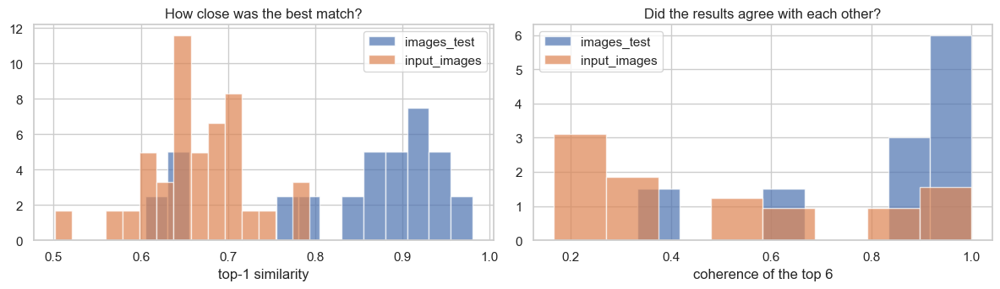

Saved to outputs/ - 31 summary rows, 186 retrieved-item rows


In [23]:
# ============================================
# CELL 23 - Catalogue photos vs real uploads
# ============================================

if user_paths:
    def coherence_of(positions):
        types = article[positions]
        return np.array([(row == row[0]).mean() for row in types])

    test_coherence = coherence_of(engines["bg-augmented"]["positions"])
    user_coherence = coherence_of(user_positions)

    domain = pd.DataFrame([
        {"source": "images_test (catalogue)", "n": len(test_coherence),
         "mean top-1 similarity": round(float(engines["bg-augmented"]["scores"][:, 0].mean()), 3),
         "mean coherence": round(float(test_coherence.mean()), 3)},
        {"source": "input_images (uploads)", "n": len(user_coherence),
         "mean top-1 similarity": round(float(user_scores[:, 0].mean()), 3),
         "mean coherence": round(float(user_coherence.mean()), 3)},
    ])
    display(domain)

    fig, axes = plt.subplots(1, 2, figsize=(12, 3.6))
    axes[0].hist(engines["bg-augmented"]["scores"][:, 0], bins=15, alpha=0.7,
                 label="images_test", density=True)
    axes[0].hist(user_scores[:, 0], bins=15, alpha=0.7, label="input_images", density=True)
    axes[0].set_xlabel("top-1 similarity"); axes[0].legend()
    axes[0].set_title("How close was the best match?")
    axes[1].hist(test_coherence, bins=8, alpha=0.7, label="images_test", density=True)
    axes[1].hist(user_coherence, bins=8, alpha=0.7, label="input_images", density=True)
    axes[1].set_xlabel("coherence of the top 6"); axes[1].legend()
    axes[1].set_title("Did the results agree with each other?")
    plt.tight_layout(); plt.show()

    domain.to_csv(PROJECT_DIR / "outputs" / "task4_domain_comparison.csv", index=False)
    user_predictions.to_csv(PROJECT_DIR / "outputs" / "task4_userimage_predictions.csv",
                            index=False)
    user_detailed.to_csv(PROJECT_DIR / "outputs" / "task4_userimage_topk.csv", index=False)
    print(f"Saved to outputs/ - {len(user_predictions)} summary rows, "
          f"{len(user_detailed)} retrieved-item rows")

## 11. Multi-garment retrieval

The largest remaining failure is structural: the encoder produces **one** vector per image, so a
photograph containing a jacket, a shirt and trousers is averaged into a single vector that
describes none of them. That is why full outfits return incoherent results.

The fix is to search **regions** rather than the whole frame.

**Getting the regions.** Connected components on the subject mask are not enough — garments in
a worn outfit touch each other, so segmentation returns one blob (only 1 of 31 uploads split
this way). Instead the subject's bounding box is divided into overlapping **horizontal bands**,
which for a standing figure map onto upper body, lower body and footwear. Connected components
are still used when they do exist, as for a flat-lay of several separate items.

**Choosing which regions to keep.** Every region is searched, then scored without labels:

* **coherence** — the share of the top-K sharing the first result's `articleType`;
* **top-1 similarity** — how close the nearest catalogue item is.

A region containing one clean garment scores high on both; a region straddling two garments, or
mostly background, scores low and is discarded.

In [24]:
# ============================================
# CELL 24 - Propose regions within an image
# ============================================

import cv2
from src.visual_search.search_engine import foreground_mask, _to_rgb_on_white

BAND_LAYOUT = [("upper", 0.00, 0.55), ("lower", 0.45, 1.00),
                ("top3", 0.00, 0.38), ("mid3", 0.31, 0.69), ("low3", 0.62, 1.00)]

# A band that is a thin strip becomes a smear once stretched to 60x80, and thin
# smears land in whichever dense cluster happens to be nearby. Reject them.
MIN_CROP_PIXELS = 48 * 48
MIN_ASPECT, MAX_ASPECT = 0.25, 4.0


def propose_regions(rgb, min_cover=0.10, min_component=0.03):
    """Whole subject, any separate components, and horizontal bands of the subject."""
    mask, method = foreground_mask(rgb)
    height, width = mask.shape
    ys, xs = np.where(mask)
    if len(ys) < 20:
        return [{"name": "whole", "bbox": (0, 0, width, height), "cover": 1.0}], mask, method

    y0, y1, x0, x1 = ys.min(), ys.max(), xs.min(), xs.max()
    regions = [{"name": "whole", "bbox": (x0, y0, x1 + 1, y1 + 1),
                "cover": float(mask[y0:y1 + 1, x0:x1 + 1].mean())}]

    # separate objects, when the subject genuinely splits (flat-lays of several items)
    closed = cv2.morphologyEx(mask.astype(np.uint8), cv2.MORPH_CLOSE,
                              np.ones((5, 5), np.uint8), iterations=2)
    count, labels, stats, _ = cv2.connectedComponentsWithStats(closed, 8)
    components = [i for i in range(1, count)
                  if stats[i, cv2.CC_STAT_AREA] / (height * width) > min_component]
    if len(components) > 1:
        for i in components:
            x, y = stats[i, cv2.CC_STAT_LEFT], stats[i, cv2.CC_STAT_TOP]
            w, h = stats[i, cv2.CC_STAT_WIDTH], stats[i, cv2.CC_STAT_HEIGHT]
            regions.append({"name": f"part{i}", "bbox": (x, y, x + w, y + h),
                            "cover": float((labels[y:y + h, x:x + w] == i).mean())})

    # horizontal bands - upper body, lower body, footwear for a standing figure
    span = y1 - y0 + 1
    for name, start, end in BAND_LAYOUT:
        ya, yb = int(y0 + start * span), int(y0 + end * span)
        if yb - ya < 12:
            continue
        band = mask[ya:yb, x0:x1 + 1]
        if band.mean() < min_cover:
            continue
        columns = np.where(band.any(axis=0))[0]
        if len(columns) < 5:
            continue
        regions.append({"name": name,
                        "bbox": (x0 + columns.min(), ya, x0 + columns.max() + 1, yb),
                        "cover": float(band.mean())})

    # drop degenerate boxes before anything is embedded
    keep = []
    for region in regions:
        bx0, by0, bx1, by1 = region["bbox"]
        w, h = bx1 - bx0, by1 - by0
        if w * h < MIN_CROP_PIXELS:
            continue
        if not (MIN_ASPECT <= w / max(h, 1) <= MAX_ASPECT):
            continue
        keep.append(region)
    return (keep or regions[:1]), mask, method


def crop_region(rgb, mask, bbox, margin=0.04):
    """Cut the region out and place it on white, matching catalogue presentation."""
    x0, y0, x1, y1 = bbox
    mx, my = int((x1 - x0) * margin) + 1, int((y1 - y0) * margin) + 1
    x0, y0 = max(0, x0 - mx), max(0, y0 - my)
    x1, y1 = min(rgb.shape[1], x1 + mx), min(rgb.shape[0], y1 + my)
    patch, patch_mask = rgb[y0:y1, x0:x1], mask[y0:y1, x0:x1]
    on_white = np.where(patch_mask[..., None], patch, 255).astype(np.uint8)
    resized = Image.fromarray(on_white).resize(IMAGE_SIZE_PIL, Image.BILINEAR)
    return np.asarray(resized, dtype=np.uint8)


if user_paths:
    sample_path = user_paths[0]
    with Image.open(sample_path) as opened:
        probe_rgb = np.asarray(_to_rgb_on_white(opened))
    probe_regions, probe_mask, probe_method = propose_regions(probe_rgb)
    print(f"{sample_path.name}: {len(probe_regions)} regions "
          f"({[r['name'] for r in probe_regions]}), segmentation via {probe_method}")

1017_women_0023_a36fe2486db54e83b62813b56147a042_master.webp: 6 regions (['whole', 'upper', 'lower', 'top3', 'mid3', 'low3']), segmentation via grabcut+core


In [25]:
# ============================================
# CELL 25 - Search every region of every upload
# ============================================

if user_paths:
    # RUN 1 of this section used coherence as the primary signal and it backfired:
    # coherence rose from 0.61 to 0.92 while similarity FELL from 0.687 to 0.660,
    # and 36% of accepted regions matched to just three types (Socks, Handbags,
    # Backpacks). A thin crop on white resembles a vague fabric shape, lands in a
    # large homogeneous cluster, and returns six identical types - perfectly
    # coherent and completely wrong.
    #
    # Similarity is therefore the primary criterion, and a region must not be a
    # WORSE match than the whole image it came from. Coherence is a secondary
    # check only.
    MIN_SIMILARITY = 0.62
    MIN_COHERENCE = 0.5
    SIMILARITY_TOLERANCE = 0.01      # how far below the whole image a region may fall
    TOP_K_REGION = 6

    region_rows, per_image = [], {}
    for path in user_paths:
        with Image.open(path) as opened:
            rgb = np.asarray(_to_rgb_on_white(opened))
        regions, mask, _ = propose_regions(rgb)
        crops = np.stack([crop_region(rgb, mask, r["bbox"]) for r in regions])

        vectors = _embed(predict_model, crops, tta=True)
        scores = torch.from_numpy(vectors).to(DEVICE) @ \
            torch.from_numpy(catalogue_vectors).to(DEVICE).T
        top = torch.topk(scores, k=TOP_K_REGION, dim=1)
        positions = CATALOGUE_POS[top.indices.cpu().numpy()]
        values = top.values.cpu().numpy()

        whole_similarity = float(values[0, 0])          # index 0 is always "whole"

        entries = []
        for index, region in enumerate(regions):
            retrieved = article[positions[index]]
            coherence = float((retrieved == retrieved[0]).mean())
            similarity = float(values[index, 0])
            accepted = (similarity >= MIN_SIMILARITY
                        and coherence >= MIN_COHERENCE
                        and (region["name"] == "whole"
                             or similarity >= whole_similarity - SIMILARITY_TOLERANCE))
            entry = {"file": path.name[:30], "region": region["name"],
                     "match": retrieved[0],
                     "colour": colour_values[positions[index][0]],
                     "similarity": round(similarity, 3),
                     "coherence": round(coherence, 2),
                     "vs whole": round(similarity - whole_similarity, 3),
                     "accepted": bool(accepted)}
            entries.append(entry); region_rows.append(entry)
        per_image[path.name] = {"regions": regions, "crops": crops,
                                "positions": positions, "values": values,
                                "entries": entries, "rgb": rgb}

    region_table = pd.DataFrame(region_rows)
    print(f"{len(user_paths)} images -> {len(region_table)} regions searched")
    print(f"accepted: {int(region_table['accepted'].sum())} "
          f"({region_table['accepted'].mean() * 100:.0f}%)\n")

    # Attractor check: a handful of large clusters can swallow any ambiguous crop.
    # If a few types dominate the accepted matches, the regions are not finding
    # garments, they are falling into dense neighbourhoods.
    accepted_rows = region_table[region_table["accepted"]]
    if len(accepted_rows):
        counts = accepted_rows["match"].value_counts()
        share = counts.head(3).sum() / len(accepted_rows)
        print("most frequent accepted matches:")
        display(counts.head(8).to_frame("regions"))
        print(f"top 3 types account for {share * 100:.0f}% of accepted regions")
        if share > 0.4:
            print("WARNING: a few types dominate. Raise MIN_SIMILARITY, or treat the")
            print("region results as unreliable for this image set.")

    # how many distinct garments does each image yield?
    found = (accepted_rows.groupby("file")["match"].agg(lambda s: sorted(set(s))))
    multi = found[found.apply(len) > 1]
    print(f"\nimages where regions found more than one garment type: {len(multi)}")
    display(multi.to_frame("garments found").head(15))

31 images -> 186 regions searched
accepted: 53 (28%)

most frequent accepted matches:


,regions
match,
Socks,8
Bra,6
Skirts,4
Briefs,4
Backpacks,4
Leggings,3
Handbags,3
Pendant,3


top 3 types account for 34% of accepted regions

images where regions found more than one garment type: 9


,garments found
file,
4130636080047_004_b14.webp,"[Leggings, Sarees, Scarves, Socks]"
600_google-pattern-socks.jpg,"[Fragrance Gift Set, Perfume and Body Mist, So..."
The_dress_blueblackwhitegold.j,"[Backpacks, Handbags]"
d8ff992811e561202194328c9562a8,"[Bra, Casual Shoes]"
giay-local-brand-viet-nam_b140,"[Socks, Sunglasses]"
images (3).jpg,"[Bra, Leggings]"
images (5).jpg,"[Necklace and Chains, Pendant]"
images (8).jpg,"[Dresses, Leggings, Sarees, Skirts]"
mygoods_34_475601_3x4-ezgif.co,"[Handbags, Socks]"


,match_whole,similarity_whole,coherence_whole,region,match_best_region,similarity_best_region,coherence_best_region,coherence gain
file,,,,,,,,
giay-local-brand-viet-nam_b140,Handbags,0.575,0.17,top3,Socks,0.717,1.00,0.83
images (6).jpg,Flats,0.689,0.33,upper,Bra,0.696,1.00,0.67
mygoods_34_475601_3x4-ezgif.co,Tops,0.680,0.17,upper,Handbags,0.719,0.83,0.66
Afternoon_ensemble_MET_63.212a,Skirts,0.766,0.50,lower,Skirts,0.812,1.00,0.50
d8ff992811e561202194328c9562a8,Sandals,0.596,0.50,part3,Bra,0.705,1.00,0.50
600_google-pattern-socks.jpg,Socks,0.633,0.50,top3,Perfume and Body Mist,0.741,1.00,0.50
1017_women_0023_a36fe2486db54e,Stoles,0.672,0.33,upper,Bra,0.719,0.83,0.50
25637193-carousel-block-earrin,Casual Shoes,0.686,0.33,low3,Watches,0.719,0.50,0.17
images (5).jpg,Pendant,0.697,0.83,mid3,Pendant,0.728,1.00,0.17


mean coherence  - whole 0.608 -> best region 0.618
mean similarity - whole 0.687 -> best region 0.719
regions that found a CLOSER match: 21/31

Read similarity first. Coherence rising while similarity falls means the
crop landed in a dense cluster rather than finding a better match - the
region should be rejected, not celebrated.


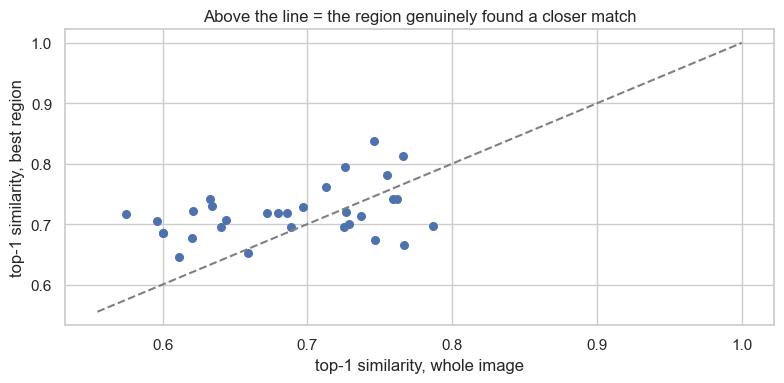

Saved to outputs/


In [26]:
# ============================================
# CELL 26 - Does searching regions beat searching the whole image?
# ============================================

if user_paths:
    whole = region_table[region_table["region"] == "whole"].set_index("file")
    # Rank candidate regions by SIMILARITY. Ranking by coherence selects whichever
    # crop fell into the densest cluster, which is the failure mode described above.
    best = (region_table[region_table["region"] != "whole"]
            .sort_values("similarity", ascending=False)
            .groupby("file").first())

    compare = whole[["match", "similarity", "coherence"]].join(
        best[["region", "match", "similarity", "coherence"]],
        lsuffix="_whole", rsuffix="_best_region").dropna()
    compare["coherence gain"] = (compare["coherence_best_region"]
                                 - compare["coherence_whole"]).round(2)
    display(compare.sort_values("coherence gain", ascending=False).head(15))

    compare["similarity gain"] = (compare["similarity_best_region"]
                                  - compare["similarity_whole"]).round(3)

    print(f"mean coherence  - whole {compare['coherence_whole'].mean():.3f} -> "
          f"best region {compare['coherence_best_region'].mean():.3f}")
    print(f"mean similarity - whole {compare['similarity_whole'].mean():.3f} -> "
          f"best region {compare['similarity_best_region'].mean():.3f}")
    print(f"regions that found a CLOSER match: "
          f"{int((compare['similarity gain'] > 0).sum())}/{len(compare)}")
    print()
    print("Read similarity first. Coherence rising while similarity falls means the")
    print("crop landed in a dense cluster rather than finding a better match - the")
    print("region should be rejected, not celebrated.")

    fig, ax = plt.subplots(figsize=(8, 4))
    ax.scatter(compare["similarity_whole"], compare["similarity_best_region"], s=30)
    low = min(compare["similarity_whole"].min(), compare["similarity_best_region"].min())
    limits = [low - 0.02, 1.0]
    ax.plot(limits, limits, ls="--", color="grey")
    ax.set_xlabel("top-1 similarity, whole image")
    ax.set_ylabel("top-1 similarity, best region")
    ax.set_title("Above the line = the region genuinely found a closer match")
    plt.tight_layout(); plt.show()

    region_table.to_csv(PROJECT_DIR / "outputs" / "task4_region_results.csv", index=False)
    compare.to_csv(PROJECT_DIR / "outputs" / "task4_region_vs_whole.csv")
    print("Saved to outputs/")

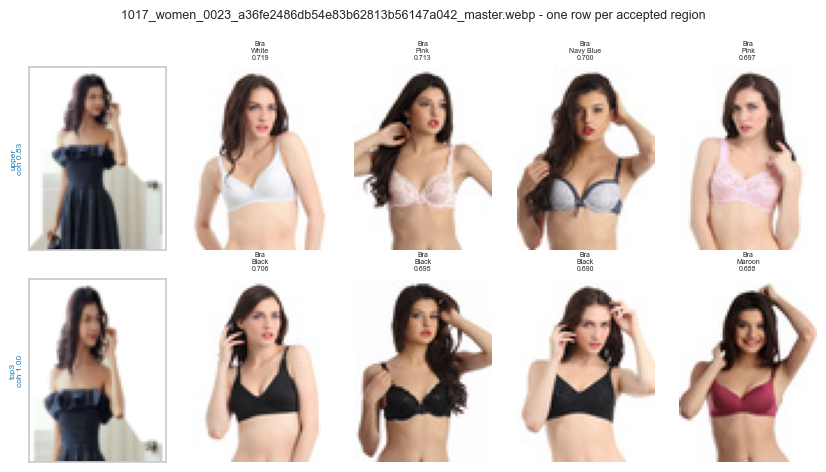

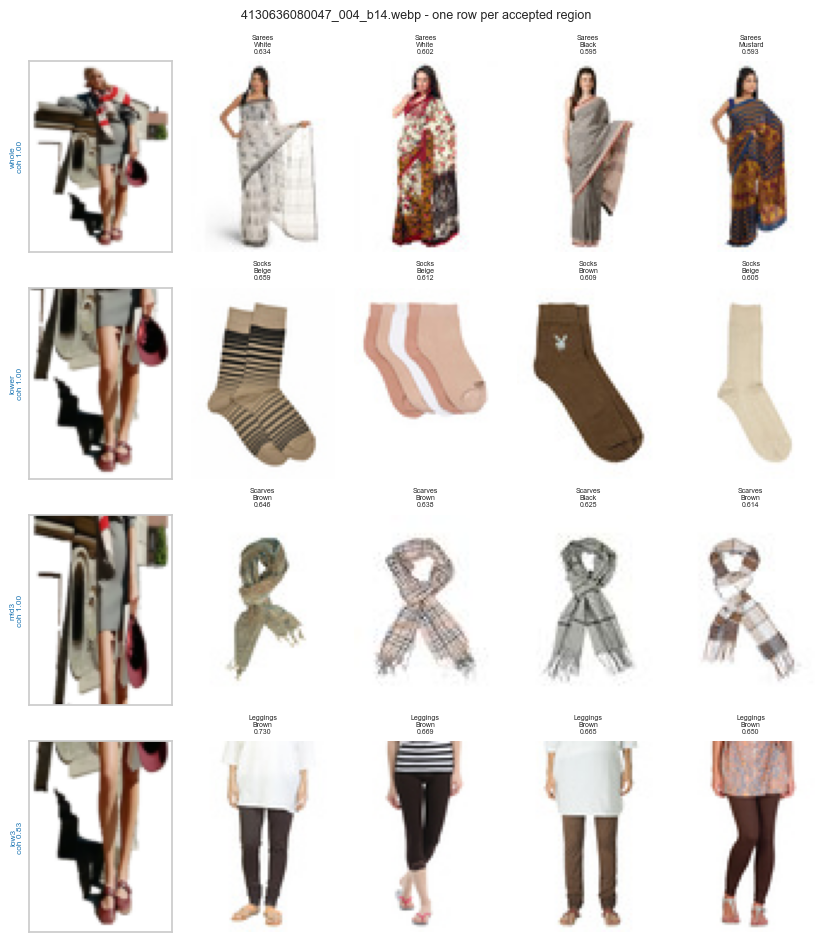

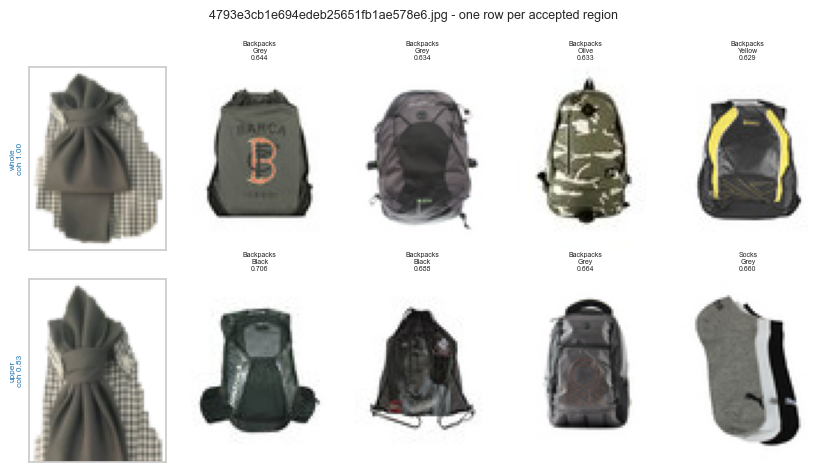

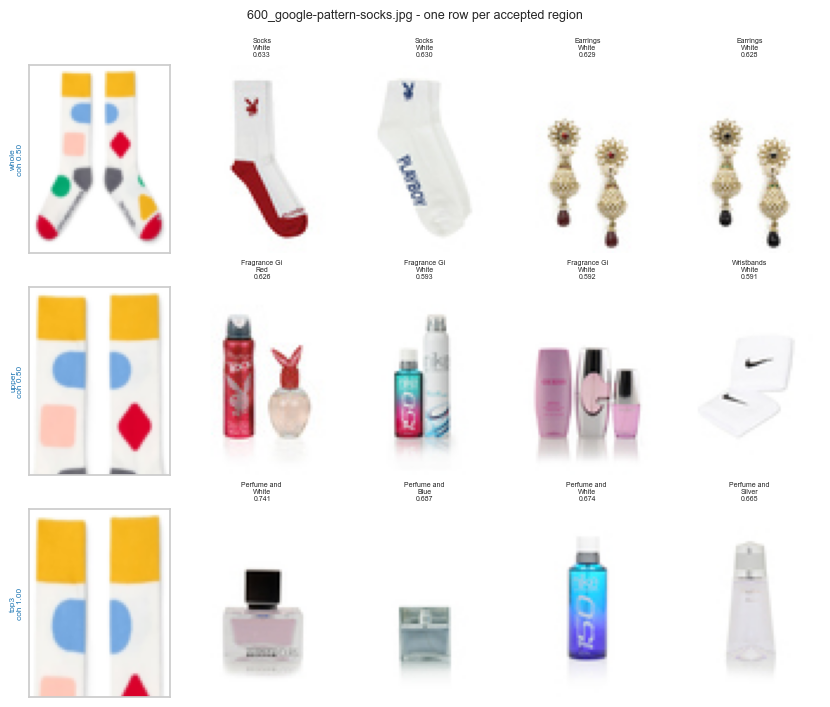

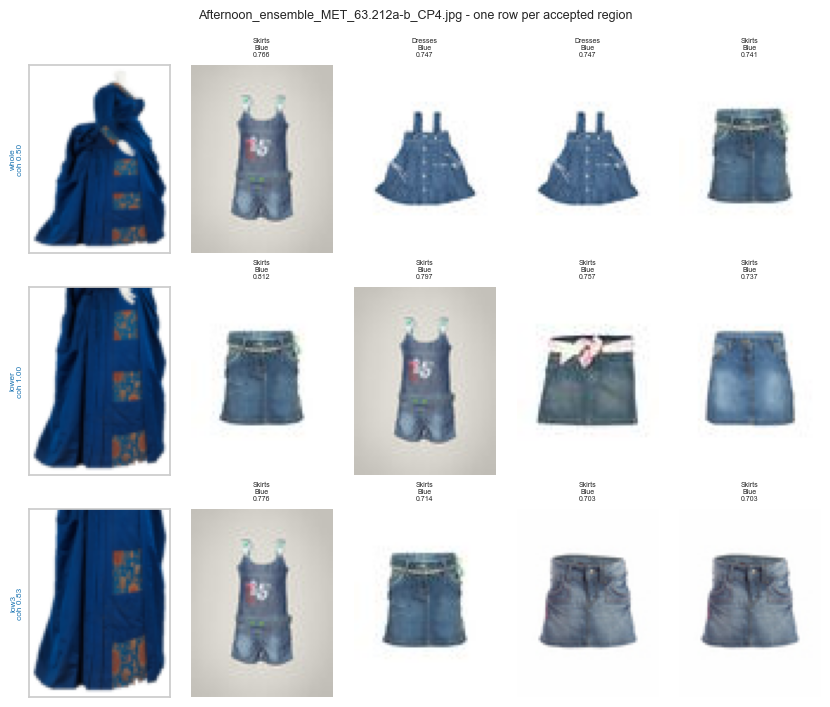

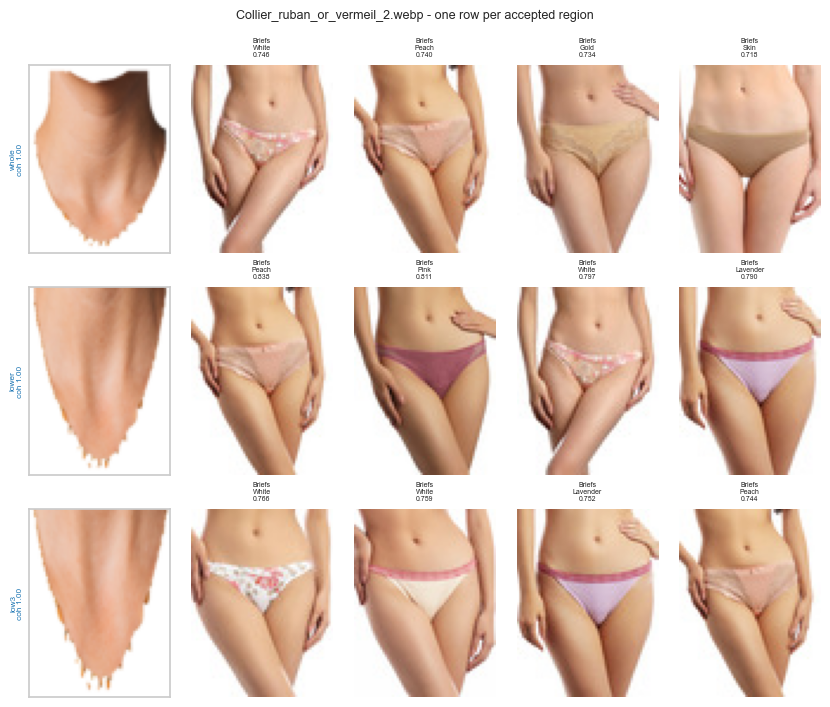

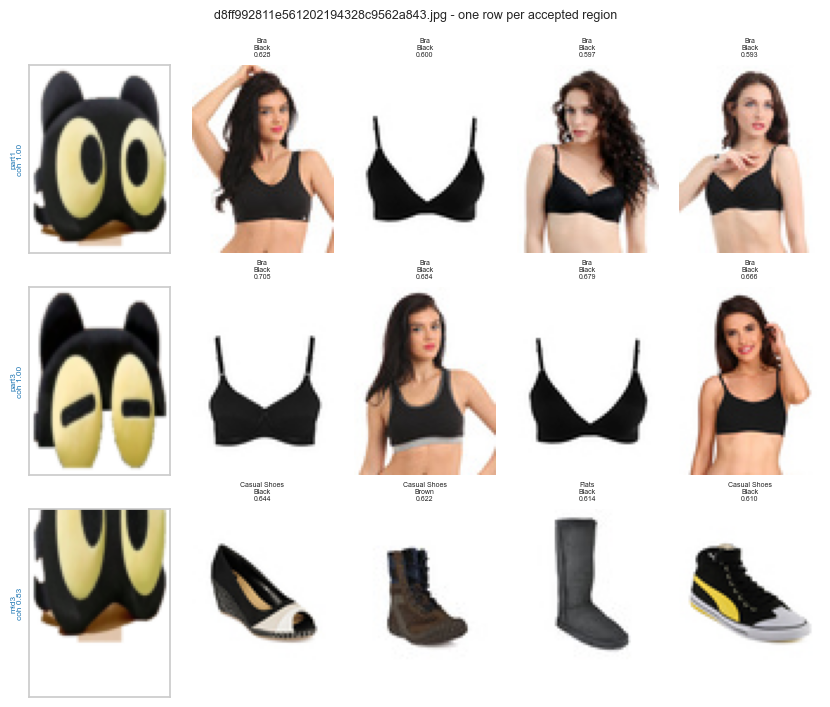

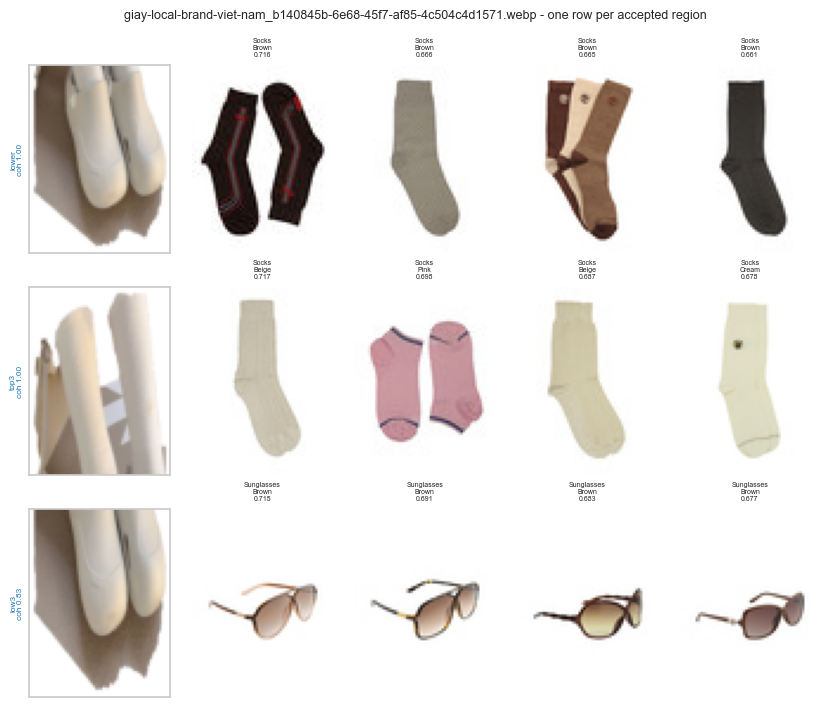

In [27]:
# ============================================
# CELL 27 - Per-garment results for the multi-item uploads
# ============================================

if user_paths:
    SHOW = 8
    interesting = [f for f in per_image
                   if sum(e["accepted"] for e in per_image[f]["entries"]) > 1][:SHOW]
    if not interesting:
        interesting = list(per_image)[:SHOW]

    for filename in interesting:
        data = per_image[filename]
        accepted = [i for i, e in enumerate(data["entries"]) if e["accepted"]]
        if not accepted:
            accepted = [0]

        rows_needed = len(accepted)
        fig, axes = plt.subplots(rows_needed, 5,
                                 figsize=(8.5, 2.4 * rows_needed), squeeze=False)
        for row, index in enumerate(accepted):
            entry = data["entries"][index]
            axes[row][0].imshow(data["crops"][index])
            axes[row][0].set_xticks([]); axes[row][0].set_yticks([])
            axes[row][0].set_ylabel(f"{entry['region']}\ncoh {entry['coherence']:.2f}",
                                    fontsize=6, color="tab:blue")
            for slot in range(4):
                position = data["positions"][index][slot]
                axes[row][slot + 1].imshow(np.asarray(IMAGES[position]))
                axes[row][slot + 1].axis("off")
                axes[row][slot + 1].set_title(
                    f"{article[position][:12]}\n{colour_values[position][:10]}\n"
                    f"{data['values'][index][slot]:.3f}", fontsize=5)
        fig.suptitle(f"{filename} - one row per accepted region", fontsize=9)
        plt.tight_layout(); plt.show()

### What to write up

* **Why augmentation was applied here but rejected in Task 3.** In Task 3 the test images were
  clean catalogue photographs, so augmentation only added noise. Here the deployment input is a
  user's photograph, so invariance to background and scale is exactly what is needed. Same
  technique, opposite conclusion, because the target distribution differs — a good illustration
  that augmentation is not universally good or bad.
* **The synthetic hard benchmark.** Real uploads carry no labels, so improvement cannot be
  measured on them. Compositing held-out items onto unseen backgrounds preserves ground truth
  while approximating the deployment distribution, and the gap between clean and hard is a
  direct measure of domain sensitivity.
* **Whatever the outcome.** If the gain is small, the honest conclusion is that 60x80 resolution
  and the flat-lay-versus-worn gap dominate, and the practical answer is to constrain the input
  (ask for a plain-background product photo) and reject low-confidence queries.